Liliana Djaja Witama\
2702219774

# UAS Deep Learning
## No 3 - Dataset A_23

**Link video:** https://drive.google.com/file/d/1xz1OS7XgIWBH4XDegE7Oqid9QtNygkaH/view?usp=sharing

## import libraries

In [ ]:
import os
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt

from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models
import time
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.applications.inception_v3 import InceptionV3

import random
SEED_VALUE=42
random.seed(SEED_VALUE)
np.random.seed(SEED_VALUE)

2025-06-25 10:35:52.296458: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750847752.501457      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750847752.562503      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## import dataset

In [2]:
image_folder = "/kaggle/input/deep-learning-a-23/A_23"

In [3]:
def load_images(folder_path):
    image_arrays = []
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

    for fname in image_files:
        img_path = os.path.join(folder_path, fname)
        img = Image.open(img_path)
        image_arrays.append(img)

    return image_arrays, image_files


loaded_images, file_names = load_images(image_folder)

## EDA

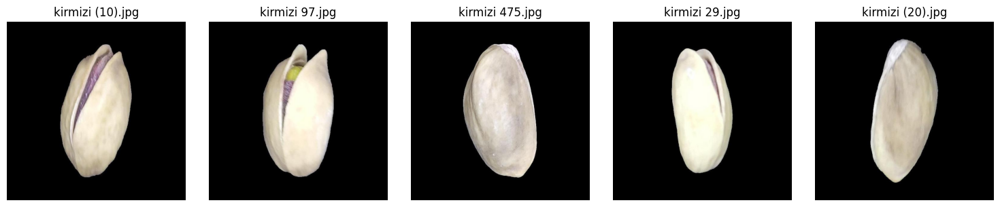

In [4]:
def show_images(images, file_names, n=5):
    plt.figure(figsize=(15, 3))
    for i in range(min(n, len(images))):
        plt.subplot(1, n, i+1)
        plt.imshow(images[i])
        plt.title(file_names[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

show_images(loaded_images, file_names, n=5)

melihat 5 contoh gambar untuk mengetahui data aktual

### aspect ratio

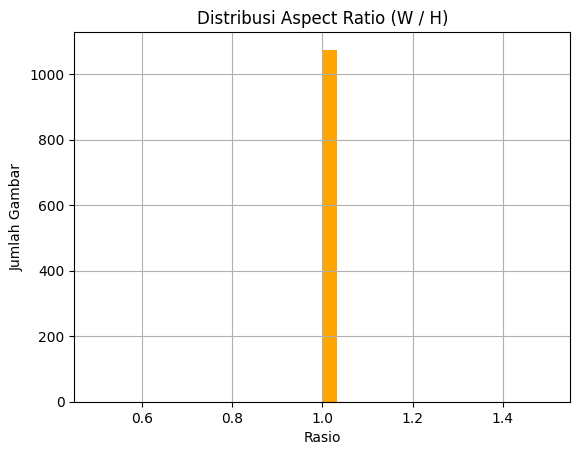

In [5]:
aspect_ratios = []

for img in loaded_images:
    w, h = img.size
    if h > 0:
        aspect_ratios.append(round(w / h, 2))

plt.hist(aspect_ratios, bins=30, color='orange')
plt.title("Distribusi Aspect Ratio (W / H)")
plt.xlabel("Rasio")
plt.ylabel("Jumlah Gambar")
plt.grid(True)
plt.show()

Melihat aspect ration untuk mengetahui distribusi bentuk gambar dalam dataset (landscape/portrait) dan apakah terdapat rasio yang terlau ekstrem (terlalu lebar/tinggi).

Dari grafik tersebut dapat diketahui bahwa semua gambar memiliki rasio mendekati 1.0 (persegi).

### distribusi resolusi

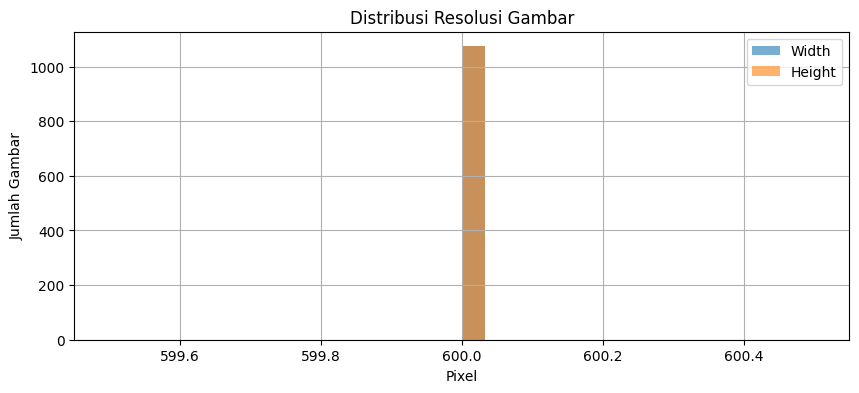

In [6]:
widths, heights = [], []

for img in loaded_images:
    w, h = img.size
    widths.append(w)
    heights.append(h)

plt.figure(figsize=(10, 4))
plt.hist(widths, bins=30, alpha=0.6, label='Width')
plt.hist(heights, bins=30, alpha=0.6, label='Height')
plt.title("Distribusi Resolusi Gambar")
plt.xlabel("Pixel")
plt.ylabel("Jumlah Gambar")
plt.legend()
plt.grid(True)
plt.show()

Melihat distribusi resolusi gambar untuk mengetahui ukuran gambar dalam dataset untuk menilai variasi resolusi dan untuk mengidentifikasi gambar dengan resolusi tidak standar yang mungkin memerlukan preprocessing khusus.

Dari grafik dapat diketahui bahwa semua gambar dalam datset memiliki resolusi yang seragam yaitu di 600x600 pixel.

### resize dan normalisasi

In [ ]:
def resize_and_normalize(images, target_size=(100, 100)):
    processed = []
    for img in images:
        img_resized = img.resize(target_size)
        arr = (np.array(img_resized) / 127.5) - 1.0  #hasil [-1, 1] -> KARENA GAN PAKE TANH
        processed.append(arr)
    return np.array(processed)

image_array = resize_and_normalize(loaded_images)

### distribusi nilai pixel

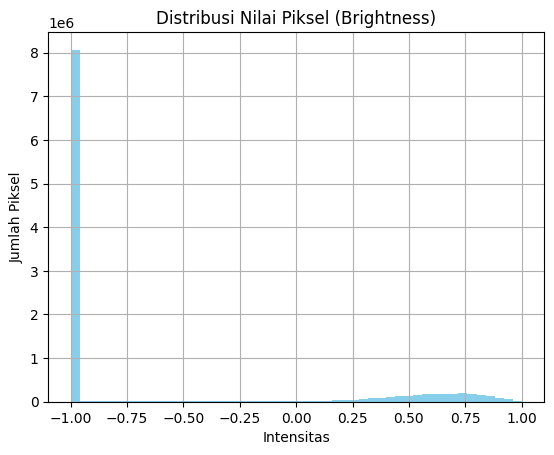

In [ ]:
all_pixels = []

for arr in image_array:
    if arr.ndim == 3:
        arr = arr.mean(axis=2)
    all_pixels.extend(arr.flatten())

plt.hist(all_pixels, bins=50, color='skyblue')
plt.title("Distribusi Nilai Piksel (Brightness)")
plt.xlabel("Intensitas")
plt.ylabel("Jumlah Piksel")
plt.grid(True)
plt.show()

Melihat distribusi brightness untuk mengidentifikasi masalah seperti over/underexposure (terlalu terang/gelap) atau low contrast dan melihat apakah dataset memiliki variasi pencahayaan yang memadai untuk melatih model yang robust.

Dari grafik bisa terlihat bahwa ada distribusi yang simetris dengan puncak berada di intensitas menengah (+-0.5) dengan ekor ke 0 (gelap) dan 1 (terang). Ini menunjukkan variasi pencahayaan yang seimbang. Puncak di dekat 0 menandakan bahwa terdapat banyak piksel gelap (underexposed).

### train dataset

In [ ]:
#konversi ke TensorFlow
BUFFER_SIZE = len(image_array)
BATCH_SIZE = 32

train_dataset = tf.data.Dataset.from_tensor_slices(image_array).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

I0000 00:00:1750847798.381063      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1750847798.381706      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


## Modelling

### GAN baseline

In [10]:
IMG_SHAPE = (100, 100, 3)
LATENT_DIM = 100

In [ ]:
def build_generator():
    model = models.Sequential(name="Generator")

    model.add(layers.Dense(100 * 100 * 16, input_dim=LATENT_DIM))
    model.add(layers.Reshape((100, 100, 16)))

    model.add(layers.ZeroPadding2D(padding=3))

    model.add(layers.Conv2D(16, kernel_size=3, strides=1, padding='valid', activation='relu'))
    model.add(layers.Conv2D(32, kernel_size=3, strides=1, padding='valid', activation='relu'))
    model.add(layers.Conv2D(64, kernel_size=3, strides=1, padding='valid', activation='relu'))

    model.add(layers.Conv2D(3, kernel_size=1, strides=1, padding='valid', activation='tanh'))

    return model

In [ ]:
def build_discriminator():
    model = models.Sequential(name="Discriminator")
    
    model.add(layers.Conv2D(16, kernel_size=3, strides=1, padding='valid', 
                            activation='relu', input_shape=(100, 100, 3)))
    model.add(layers.Conv2D(32, kernel_size=3, strides=1, padding='valid', activation='relu'))
    model.add(layers.Conv2D(64, kernel_size=3, strides=1, padding='valid', activation='relu'))
    
    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))
    
    return model

In [64]:
generator = build_generator()
discriminator = build_discriminator()

In [65]:
#loss dan optimizer
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=False)
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

Perhitungan loss menggunakan binary cross-entropy karena Discriminator adalah classifier biner dan output model sudah berupa probabilitas (sigmoid).

Optimizer menggunakan Adam karena cocok untuk masalah non-konveks (seperti GAN) karena adaptif terhadap gradien.

In [ ]:
def train_step(images):
    noise = tf.random.normal([tf.shape(images)[0], LATENT_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = cross_entropy(tf.ones_like(fake_output), fake_output)
        disc_loss_real = cross_entropy(tf.ones_like(real_output), real_output)
        disc_loss_fake = cross_entropy(tf.zeros_like(fake_output), fake_output)
        disc_loss = disc_loss_real + disc_loss_fake

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

Function train_step akan melakukan:
- membuat noise input untuk generator
- forward pass di mana generator mengubah noise menjadi gambar palsu dan discriminator mengevaluasi real_output dan fake_output
- menghitung loss (gen_loss dan disc_loss)
- melakukan backpropagation dan upgrate bobot
- return loss (gen_loss dan disc_loss)

In [ ]:
def show_generated_images(generator, epoch, n_images=9):
    noise = tf.random.normal([n_images, LATENT_DIM])
    generated_images = generator(noise, training=False)
    generated_images = (generated_images + 1) / 2.0

    plt.figure(figsize=(6, 6))
    for i in range(n_images):
        plt.subplot(3, 3, i + 1)
        plt.imshow(generated_images[i].numpy())
        plt.axis('off')
    plt.suptitle(f"Generated Images at Epoch {epoch+1}")
    plt.tight_layout()
    plt.show()

menampilkan hasil 9 gambar setelah 10 epochs

In [ ]:
gen_losses = []
disc_losses = []

def train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()

        gen_loss_epoch = 0
        disc_loss_epoch = 0
        num_batches = 0

        for image_batch in dataset:
            g_loss, d_loss = train_step(image_batch)
            gen_loss_epoch += g_loss
            disc_loss_epoch += d_loss
            num_batches += 1

        avg_g_loss = gen_loss_epoch / num_batches
        avg_d_loss = disc_loss_epoch / num_batches

        gen_losses.append(avg_g_loss.numpy())
        disc_losses.append(avg_d_loss.numpy())

        print(f"Epoch {epoch+1}, Generator Loss: {avg_g_loss:.4f}, Discriminator Loss: {avg_d_loss:.4f}, Time: {time.time()-start:.2f}s")

        #tampilin gbr setiap 10 epoch
        if (epoch + 1) % 10 == 0:
            show_generated_images(generator, epoch)

Function ini melakukan:
- inisialiasi variabel tracking
- loop utama epoch
- timing dan inisialisasi -> mencatat waktu mulai epoch dan menyiapkan akumulator untuk loss dan penghitung batch
- loop melalui batch data -> memanggil train_step() dan mengakumulasi gen_loss dan disc_loss
- menghitung rata-rata loss

Epoch 1, Generator Loss: 1.1575, Discriminator Loss: 0.4646, Time: 6.63s
Epoch 2, Generator Loss: 3.9228, Discriminator Loss: 0.0396, Time: 6.04s
Epoch 3, Generator Loss: 5.8306, Discriminator Loss: 0.0049, Time: 5.96s
Epoch 4, Generator Loss: 5.7904, Discriminator Loss: 0.0102, Time: 6.02s
Epoch 5, Generator Loss: 9.4912, Discriminator Loss: 0.0269, Time: 6.12s
Epoch 6, Generator Loss: 9.2414, Discriminator Loss: 0.0005, Time: 6.13s
Epoch 7, Generator Loss: 10.0581, Discriminator Loss: 0.0001, Time: 6.26s
Epoch 8, Generator Loss: 7.5448, Discriminator Loss: 0.0481, Time: 6.23s
Epoch 9, Generator Loss: 7.2748, Discriminator Loss: 0.0680, Time: 6.25s
Epoch 10, Generator Loss: 4.1527, Discriminator Loss: 0.6280, Time: 6.18s


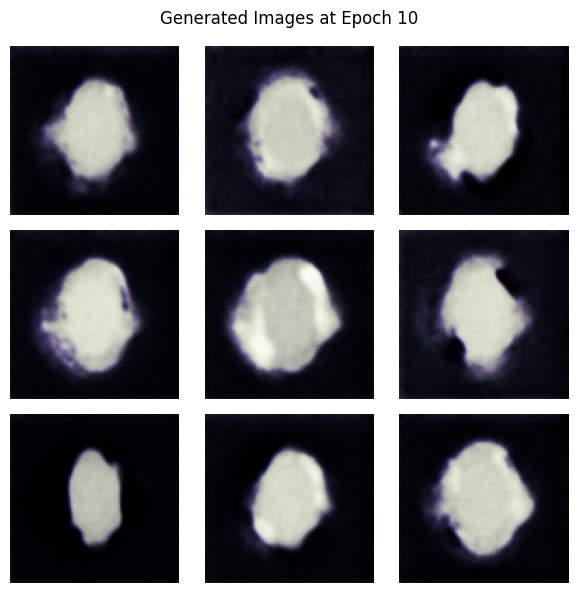

Epoch 11, Generator Loss: 3.0235, Discriminator Loss: 0.7108, Time: 6.13s
Epoch 12, Generator Loss: 2.1590, Discriminator Loss: 0.8406, Time: 6.13s
Epoch 13, Generator Loss: 2.0303, Discriminator Loss: 1.0367, Time: 6.08s
Epoch 14, Generator Loss: 1.9209, Discriminator Loss: 0.9558, Time: 6.01s
Epoch 15, Generator Loss: 2.1243, Discriminator Loss: 0.7934, Time: 6.09s
Epoch 16, Generator Loss: 2.0752, Discriminator Loss: 0.7753, Time: 6.04s
Epoch 17, Generator Loss: 1.8678, Discriminator Loss: 0.8520, Time: 6.10s
Epoch 18, Generator Loss: 1.6234, Discriminator Loss: 1.2553, Time: 6.15s
Epoch 19, Generator Loss: 2.5050, Discriminator Loss: 0.5663, Time: 6.09s
Epoch 20, Generator Loss: 1.6938, Discriminator Loss: 1.1149, Time: 6.18s


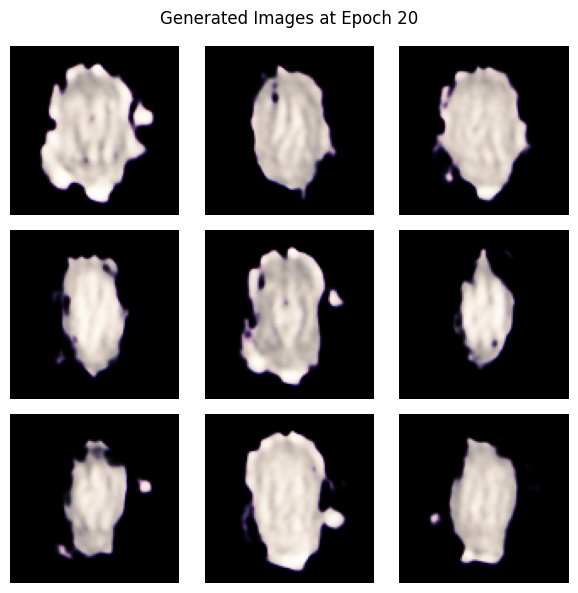

Epoch 21, Generator Loss: 1.8206, Discriminator Loss: 0.9667, Time: 6.17s
Epoch 22, Generator Loss: 1.9488, Discriminator Loss: 0.6869, Time: 6.08s
Epoch 23, Generator Loss: 1.7707, Discriminator Loss: 0.7971, Time: 6.12s
Epoch 24, Generator Loss: 1.5278, Discriminator Loss: 1.3624, Time: 6.05s
Epoch 25, Generator Loss: 2.3959, Discriminator Loss: 0.6211, Time: 6.05s
Epoch 26, Generator Loss: 1.0517, Discriminator Loss: 1.4779, Time: 6.05s
Epoch 27, Generator Loss: 1.3769, Discriminator Loss: 0.9969, Time: 6.07s
Epoch 28, Generator Loss: 1.5072, Discriminator Loss: 0.8284, Time: 6.08s
Epoch 29, Generator Loss: 1.3885, Discriminator Loss: 1.0781, Time: 6.00s
Epoch 30, Generator Loss: 1.0373, Discriminator Loss: 1.3607, Time: 6.00s


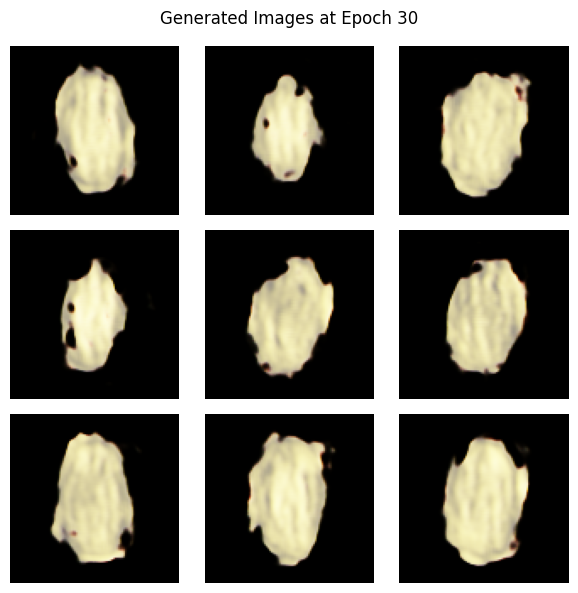

Epoch 31, Generator Loss: 1.2002, Discriminator Loss: 1.0613, Time: 6.03s
Epoch 32, Generator Loss: 1.5053, Discriminator Loss: 0.7663, Time: 6.00s
Epoch 33, Generator Loss: 1.6294, Discriminator Loss: 0.6511, Time: 6.07s
Epoch 34, Generator Loss: 0.8990, Discriminator Loss: 1.4298, Time: 6.03s
Epoch 35, Generator Loss: 1.4501, Discriminator Loss: 0.9861, Time: 6.04s
Epoch 36, Generator Loss: 1.3510, Discriminator Loss: 0.9726, Time: 6.02s
Epoch 37, Generator Loss: 1.2817, Discriminator Loss: 1.0232, Time: 6.01s
Epoch 38, Generator Loss: 1.5803, Discriminator Loss: 0.8500, Time: 6.10s
Epoch 39, Generator Loss: 1.1559, Discriminator Loss: 1.1826, Time: 5.99s
Epoch 40, Generator Loss: 1.2933, Discriminator Loss: 0.9352, Time: 5.99s


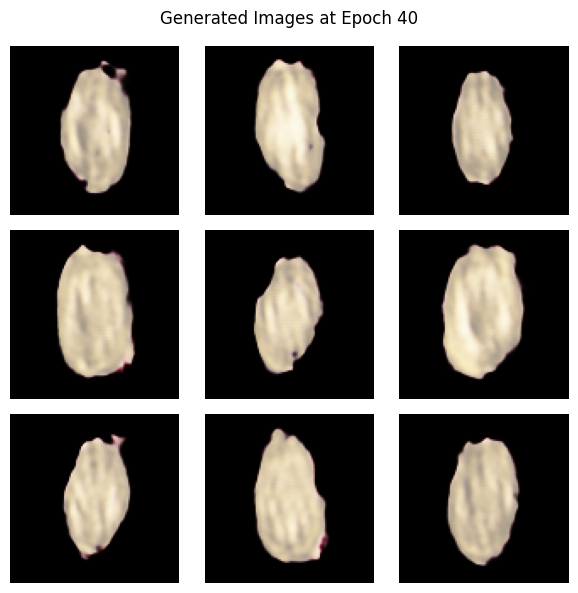

Epoch 41, Generator Loss: 0.9550, Discriminator Loss: 1.3628, Time: 6.01s
Epoch 42, Generator Loss: 1.2278, Discriminator Loss: 1.0813, Time: 5.99s
Epoch 43, Generator Loss: 1.2668, Discriminator Loss: 1.0880, Time: 6.00s
Epoch 44, Generator Loss: 0.7895, Discriminator Loss: 1.9571, Time: 6.01s
Epoch 45, Generator Loss: 1.6105, Discriminator Loss: 0.7582, Time: 6.03s
Epoch 46, Generator Loss: 0.8057, Discriminator Loss: 1.6196, Time: 6.00s
Epoch 47, Generator Loss: 0.9770, Discriminator Loss: 1.1434, Time: 5.98s
Epoch 48, Generator Loss: 1.1895, Discriminator Loss: 0.8797, Time: 6.02s
Epoch 49, Generator Loss: 1.1713, Discriminator Loss: 0.8921, Time: 6.04s
Epoch 50, Generator Loss: 0.9505, Discriminator Loss: 1.3493, Time: 6.02s


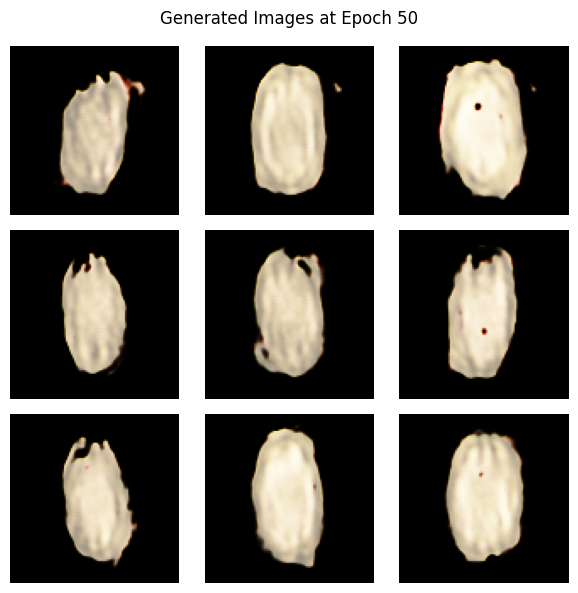

Epoch 51, Generator Loss: 0.9683, Discriminator Loss: 1.2367, Time: 6.02s
Epoch 52, Generator Loss: 1.0745, Discriminator Loss: 1.0975, Time: 5.95s
Epoch 53, Generator Loss: 1.0910, Discriminator Loss: 1.0877, Time: 6.01s
Epoch 54, Generator Loss: 0.9615, Discriminator Loss: 1.4508, Time: 6.01s
Epoch 55, Generator Loss: 1.2971, Discriminator Loss: 0.9665, Time: 6.01s
Epoch 56, Generator Loss: 1.1465, Discriminator Loss: 1.0812, Time: 5.97s
Epoch 57, Generator Loss: 1.1780, Discriminator Loss: 1.0239, Time: 5.95s
Epoch 58, Generator Loss: 1.2896, Discriminator Loss: 1.0024, Time: 5.98s
Epoch 59, Generator Loss: 0.9300, Discriminator Loss: 1.2815, Time: 6.03s
Epoch 60, Generator Loss: 1.0987, Discriminator Loss: 1.0122, Time: 6.03s


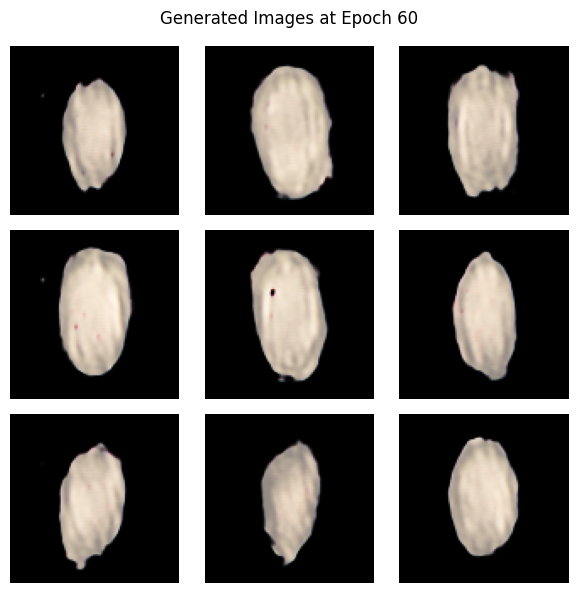

Epoch 61, Generator Loss: 1.0116, Discriminator Loss: 1.2535, Time: 6.04s
Epoch 62, Generator Loss: 1.0886, Discriminator Loss: 1.0503, Time: 6.00s
Epoch 63, Generator Loss: 1.1812, Discriminator Loss: 1.1088, Time: 6.01s
Epoch 64, Generator Loss: 1.1196, Discriminator Loss: 1.1010, Time: 6.10s
Epoch 65, Generator Loss: 1.4932, Discriminator Loss: 0.7589, Time: 6.00s
Epoch 66, Generator Loss: 0.9941, Discriminator Loss: 1.2968, Time: 6.00s
Epoch 67, Generator Loss: 1.1420, Discriminator Loss: 0.9736, Time: 6.00s
Epoch 68, Generator Loss: 1.0017, Discriminator Loss: 1.1780, Time: 6.00s
Epoch 69, Generator Loss: 1.1416, Discriminator Loss: 1.0562, Time: 6.11s
Epoch 70, Generator Loss: 1.1283, Discriminator Loss: 1.2913, Time: 6.00s


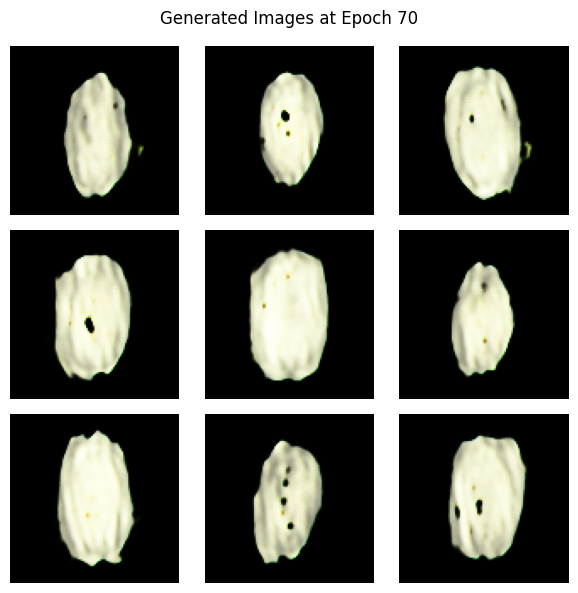

Epoch 71, Generator Loss: 1.4401, Discriminator Loss: 0.8555, Time: 6.00s
Epoch 72, Generator Loss: 1.5927, Discriminator Loss: 0.8443, Time: 5.98s
Epoch 73, Generator Loss: 0.7669, Discriminator Loss: 1.6461, Time: 5.99s
Epoch 74, Generator Loss: 1.2558, Discriminator Loss: 0.9857, Time: 6.00s
Epoch 75, Generator Loss: 1.0885, Discriminator Loss: 1.2703, Time: 6.03s
Epoch 76, Generator Loss: 1.1614, Discriminator Loss: 1.0729, Time: 6.04s
Epoch 77, Generator Loss: 1.3346, Discriminator Loss: 0.8330, Time: 6.01s
Epoch 78, Generator Loss: 0.9052, Discriminator Loss: 1.2900, Time: 6.02s
Epoch 79, Generator Loss: 1.1509, Discriminator Loss: 0.9632, Time: 6.03s
Epoch 80, Generator Loss: 1.1554, Discriminator Loss: 1.1142, Time: 6.03s


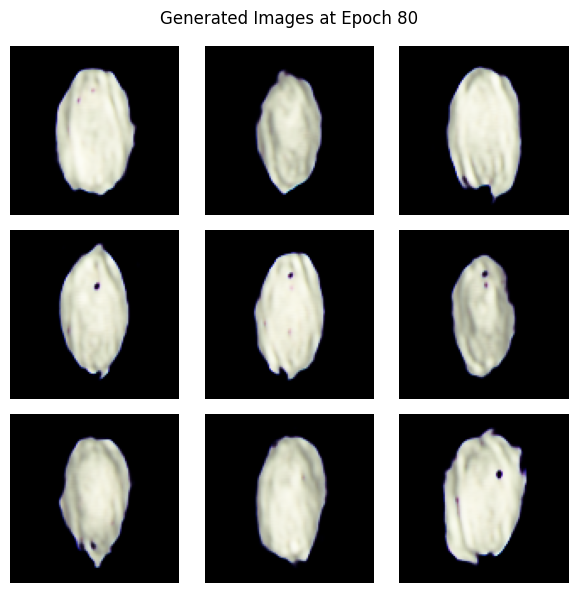

Epoch 81, Generator Loss: 1.4270, Discriminator Loss: 0.8030, Time: 6.01s
Epoch 82, Generator Loss: 1.0590, Discriminator Loss: 1.3192, Time: 5.99s
Epoch 83, Generator Loss: 1.3744, Discriminator Loss: 0.7806, Time: 6.02s
Epoch 84, Generator Loss: 1.0382, Discriminator Loss: 1.2469, Time: 5.98s
Epoch 85, Generator Loss: 1.0874, Discriminator Loss: 1.1326, Time: 6.02s
Epoch 86, Generator Loss: 1.2010, Discriminator Loss: 0.9450, Time: 5.99s
Epoch 87, Generator Loss: 1.0396, Discriminator Loss: 1.2245, Time: 5.98s
Epoch 88, Generator Loss: 1.1289, Discriminator Loss: 1.0689, Time: 5.99s
Epoch 89, Generator Loss: 0.9957, Discriminator Loss: 1.3130, Time: 6.01s
Epoch 90, Generator Loss: 1.2678, Discriminator Loss: 0.9121, Time: 6.01s


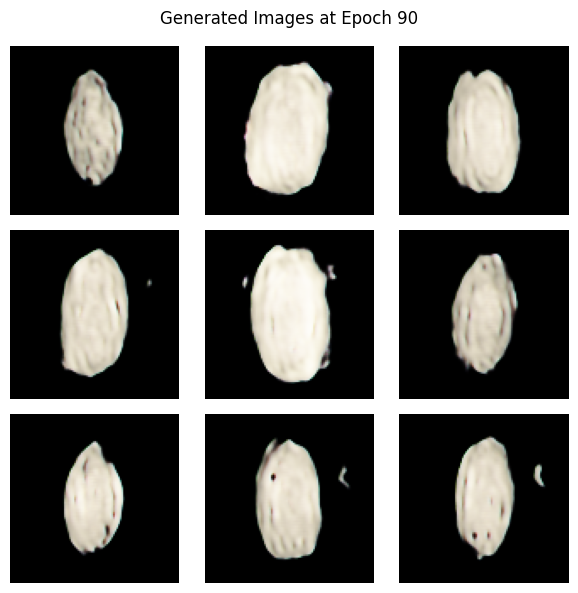

Epoch 91, Generator Loss: 1.0623, Discriminator Loss: 1.0974, Time: 6.01s
Epoch 92, Generator Loss: 1.2417, Discriminator Loss: 0.9679, Time: 5.98s
Epoch 93, Generator Loss: 0.9641, Discriminator Loss: 1.6292, Time: 5.97s
Epoch 94, Generator Loss: 1.2008, Discriminator Loss: 1.0095, Time: 5.97s
Epoch 95, Generator Loss: 1.1845, Discriminator Loss: 0.9686, Time: 6.04s
Epoch 96, Generator Loss: 0.9046, Discriminator Loss: 1.2679, Time: 6.00s
Epoch 97, Generator Loss: 1.1493, Discriminator Loss: 1.1187, Time: 5.99s
Epoch 98, Generator Loss: 1.2754, Discriminator Loss: 1.2040, Time: 6.04s
Epoch 99, Generator Loss: 1.0484, Discriminator Loss: 1.5193, Time: 5.98s
Epoch 100, Generator Loss: 1.2512, Discriminator Loss: 0.9336, Time: 6.00s


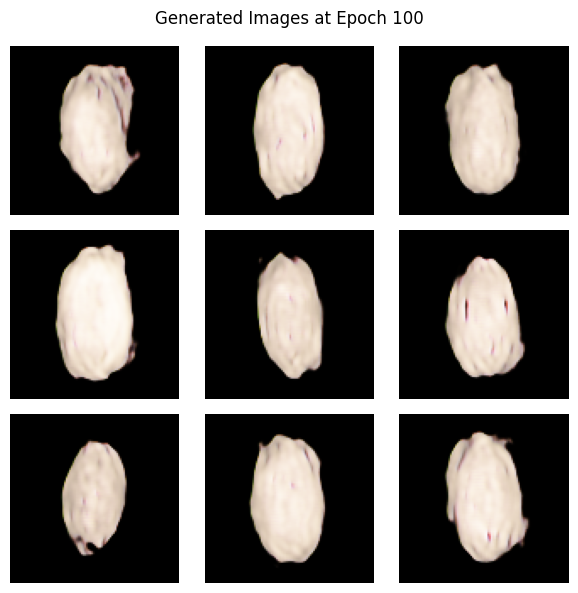

Epoch 101, Generator Loss: 0.9306, Discriminator Loss: 1.4136, Time: 6.05s
Epoch 102, Generator Loss: 1.0248, Discriminator Loss: 1.1858, Time: 5.96s
Epoch 103, Generator Loss: 0.9814, Discriminator Loss: 1.0980, Time: 6.02s
Epoch 104, Generator Loss: 0.9392, Discriminator Loss: 1.2119, Time: 5.99s
Epoch 105, Generator Loss: 1.1091, Discriminator Loss: 0.9925, Time: 5.98s
Epoch 106, Generator Loss: 1.0140, Discriminator Loss: 1.2198, Time: 6.06s
Epoch 107, Generator Loss: 0.9428, Discriminator Loss: 1.3209, Time: 5.94s
Epoch 108, Generator Loss: 1.0873, Discriminator Loss: 1.0641, Time: 5.97s
Epoch 109, Generator Loss: 0.9475, Discriminator Loss: 1.2146, Time: 6.02s
Epoch 110, Generator Loss: 1.0010, Discriminator Loss: 1.1872, Time: 5.99s


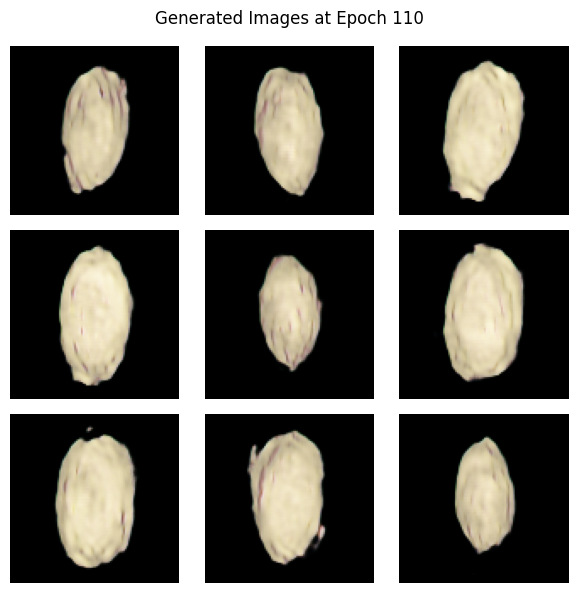

Epoch 111, Generator Loss: 1.0555, Discriminator Loss: 1.1746, Time: 6.04s
Epoch 112, Generator Loss: 0.9439, Discriminator Loss: 1.2828, Time: 6.02s
Epoch 113, Generator Loss: 1.0885, Discriminator Loss: 1.0799, Time: 5.98s
Epoch 114, Generator Loss: 0.8966, Discriminator Loss: 1.4562, Time: 6.02s
Epoch 115, Generator Loss: 1.3419, Discriminator Loss: 0.7644, Time: 5.98s
Epoch 116, Generator Loss: 1.0311, Discriminator Loss: 1.1505, Time: 6.06s
Epoch 117, Generator Loss: 1.0791, Discriminator Loss: 1.1481, Time: 6.05s
Epoch 118, Generator Loss: 1.1696, Discriminator Loss: 1.0069, Time: 6.03s
Epoch 119, Generator Loss: 1.0469, Discriminator Loss: 1.3746, Time: 6.00s
Epoch 120, Generator Loss: 1.0636, Discriminator Loss: 1.0691, Time: 6.01s


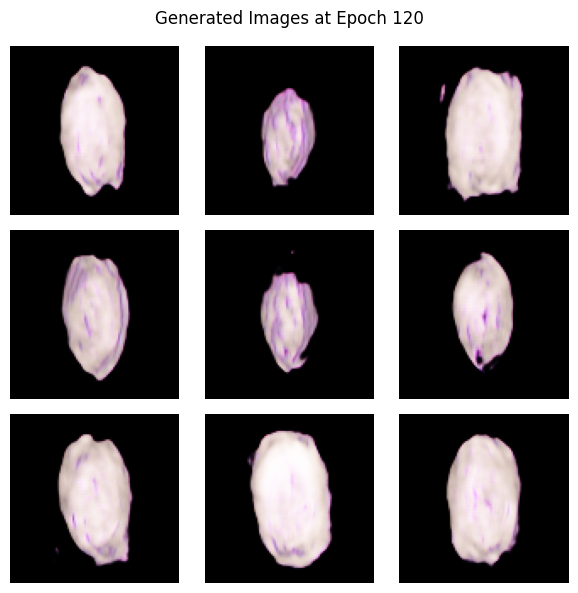

Epoch 121, Generator Loss: 1.2384, Discriminator Loss: 0.8390, Time: 6.06s
Epoch 122, Generator Loss: 0.9269, Discriminator Loss: 1.3563, Time: 6.00s
Epoch 123, Generator Loss: 1.4824, Discriminator Loss: 0.7457, Time: 6.00s
Epoch 124, Generator Loss: 0.9763, Discriminator Loss: 1.3234, Time: 6.01s
Epoch 125, Generator Loss: 1.1263, Discriminator Loss: 1.1358, Time: 6.02s
Epoch 126, Generator Loss: 1.2503, Discriminator Loss: 0.9381, Time: 6.08s
Epoch 127, Generator Loss: 1.0447, Discriminator Loss: 1.1415, Time: 6.05s
Epoch 128, Generator Loss: 0.9703, Discriminator Loss: 1.2234, Time: 6.00s
Epoch 129, Generator Loss: 1.0620, Discriminator Loss: 1.0931, Time: 6.05s
Epoch 130, Generator Loss: 1.1049, Discriminator Loss: 1.0720, Time: 6.06s


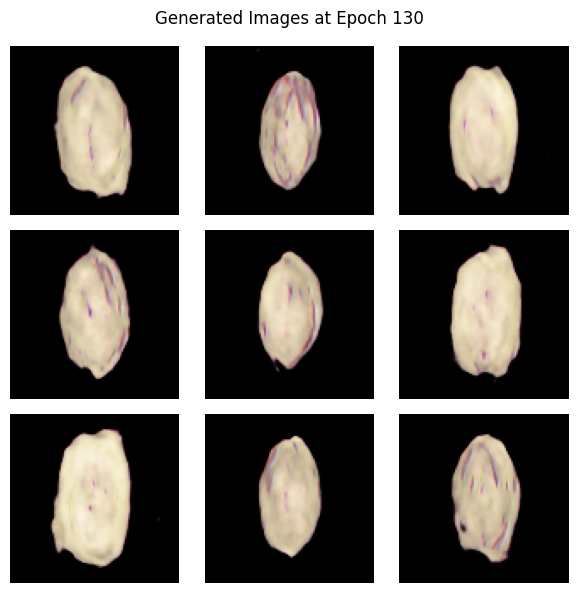

Epoch 131, Generator Loss: 1.0816, Discriminator Loss: 1.2382, Time: 6.04s
Epoch 132, Generator Loss: 1.2788, Discriminator Loss: 0.9587, Time: 6.05s
Epoch 133, Generator Loss: 1.1399, Discriminator Loss: 1.1494, Time: 6.00s
Epoch 134, Generator Loss: 0.8901, Discriminator Loss: 1.5421, Time: 6.03s
Epoch 135, Generator Loss: 1.2818, Discriminator Loss: 0.8333, Time: 5.96s
Epoch 136, Generator Loss: 0.9368, Discriminator Loss: 1.3685, Time: 6.02s
Epoch 137, Generator Loss: 1.2123, Discriminator Loss: 0.9406, Time: 6.06s
Epoch 138, Generator Loss: 0.8529, Discriminator Loss: 1.5559, Time: 6.00s
Epoch 139, Generator Loss: 1.0322, Discriminator Loss: 1.1558, Time: 6.02s
Epoch 140, Generator Loss: 1.2618, Discriminator Loss: 0.9002, Time: 5.98s


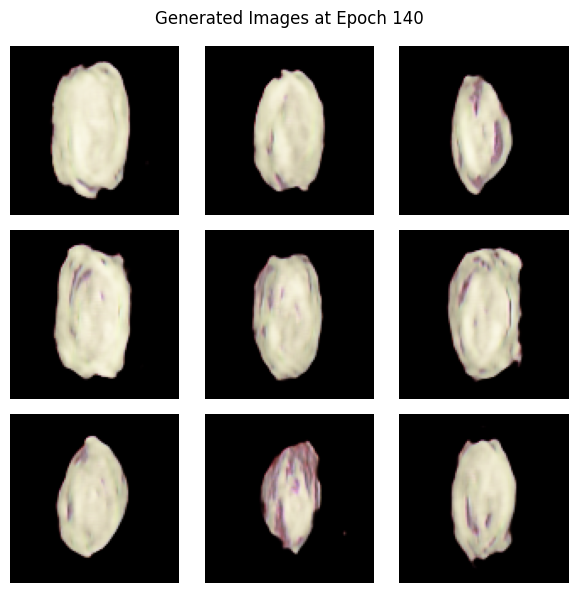

Epoch 141, Generator Loss: 0.8583, Discriminator Loss: 1.4971, Time: 6.03s
Epoch 142, Generator Loss: 1.0982, Discriminator Loss: 1.0125, Time: 6.02s
Epoch 143, Generator Loss: 0.9189, Discriminator Loss: 1.3790, Time: 6.00s
Epoch 144, Generator Loss: 1.2271, Discriminator Loss: 1.0591, Time: 5.97s
Epoch 145, Generator Loss: 1.1147, Discriminator Loss: 1.1709, Time: 6.01s
Epoch 146, Generator Loss: 1.1573, Discriminator Loss: 1.1293, Time: 6.01s
Epoch 147, Generator Loss: 0.9588, Discriminator Loss: 1.2882, Time: 6.06s
Epoch 148, Generator Loss: 1.0051, Discriminator Loss: 1.2515, Time: 6.00s
Epoch 149, Generator Loss: 1.1572, Discriminator Loss: 1.0736, Time: 6.00s
Epoch 150, Generator Loss: 1.1325, Discriminator Loss: 1.0743, Time: 6.00s


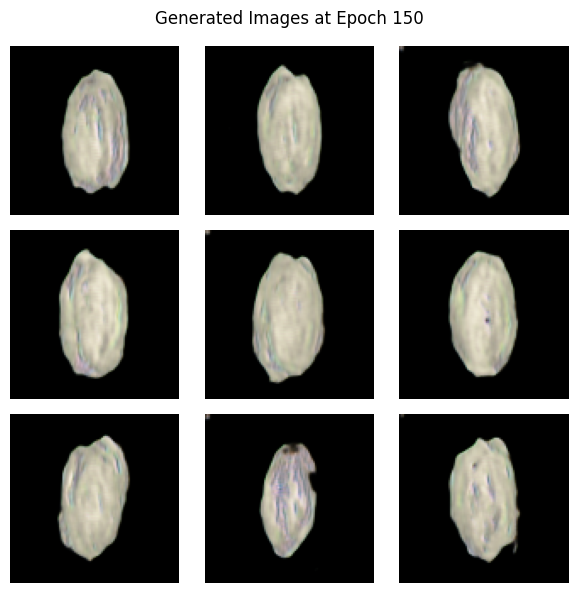

Epoch 151, Generator Loss: 1.2180, Discriminator Loss: 1.2550, Time: 6.00s
Epoch 152, Generator Loss: 1.1888, Discriminator Loss: 1.2290, Time: 6.01s
Epoch 153, Generator Loss: 1.0359, Discriminator Loss: 1.2049, Time: 5.97s
Epoch 154, Generator Loss: 1.1930, Discriminator Loss: 0.9777, Time: 5.97s
Epoch 155, Generator Loss: 0.8717, Discriminator Loss: 1.3508, Time: 5.97s
Epoch 156, Generator Loss: 1.1189, Discriminator Loss: 1.0162, Time: 5.97s
Epoch 157, Generator Loss: 1.0096, Discriminator Loss: 1.2300, Time: 6.01s
Epoch 158, Generator Loss: 0.8585, Discriminator Loss: 1.3507, Time: 6.02s
Epoch 159, Generator Loss: 0.9931, Discriminator Loss: 1.0869, Time: 5.98s
Epoch 160, Generator Loss: 0.7808, Discriminator Loss: 1.4592, Time: 6.02s


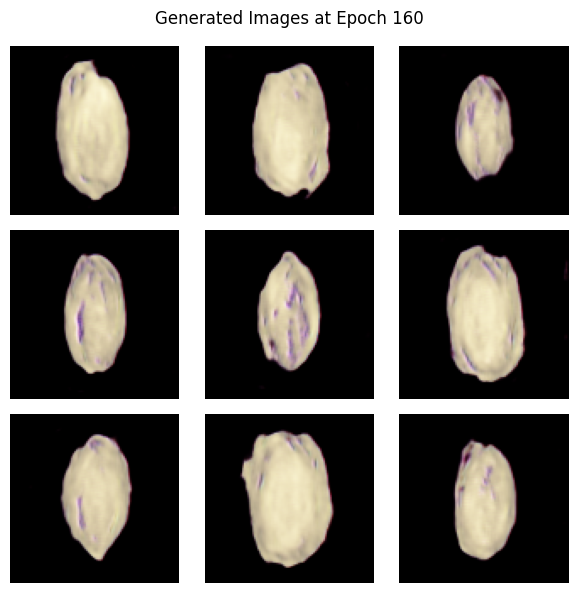

Epoch 161, Generator Loss: 1.1077, Discriminator Loss: 0.9762, Time: 5.99s
Epoch 162, Generator Loss: 1.0059, Discriminator Loss: 1.1819, Time: 5.95s
Epoch 163, Generator Loss: 0.9445, Discriminator Loss: 1.2703, Time: 6.03s
Epoch 164, Generator Loss: 1.1953, Discriminator Loss: 1.0092, Time: 5.97s
Epoch 165, Generator Loss: 0.9724, Discriminator Loss: 1.3037, Time: 5.99s
Epoch 166, Generator Loss: 0.9579, Discriminator Loss: 1.2667, Time: 5.96s
Epoch 167, Generator Loss: 0.9415, Discriminator Loss: 1.2252, Time: 6.00s
Epoch 168, Generator Loss: 1.0357, Discriminator Loss: 1.0585, Time: 6.03s
Epoch 169, Generator Loss: 1.0108, Discriminator Loss: 1.2585, Time: 5.98s
Epoch 170, Generator Loss: 1.1374, Discriminator Loss: 1.0308, Time: 6.02s


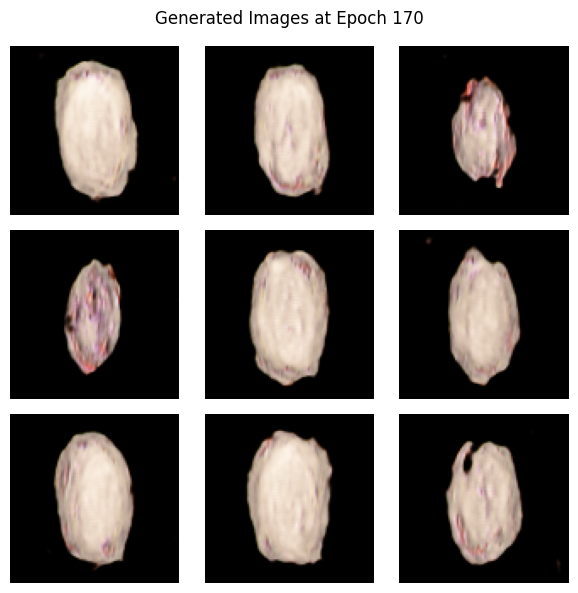

Epoch 171, Generator Loss: 1.2105, Discriminator Loss: 1.0230, Time: 5.97s
Epoch 172, Generator Loss: 1.0308, Discriminator Loss: 1.1773, Time: 5.97s
Epoch 173, Generator Loss: 1.4608, Discriminator Loss: 0.8347, Time: 6.02s
Epoch 174, Generator Loss: 1.0896, Discriminator Loss: 1.2612, Time: 5.96s
Epoch 175, Generator Loss: 1.1619, Discriminator Loss: 0.9629, Time: 5.97s
Epoch 176, Generator Loss: 1.1727, Discriminator Loss: 1.0665, Time: 5.96s
Epoch 177, Generator Loss: 1.2887, Discriminator Loss: 1.0328, Time: 5.98s
Epoch 178, Generator Loss: 0.7456, Discriminator Loss: 1.6459, Time: 5.94s
Epoch 179, Generator Loss: 1.1300, Discriminator Loss: 0.9703, Time: 6.04s
Epoch 180, Generator Loss: 1.0442, Discriminator Loss: 1.2340, Time: 6.01s


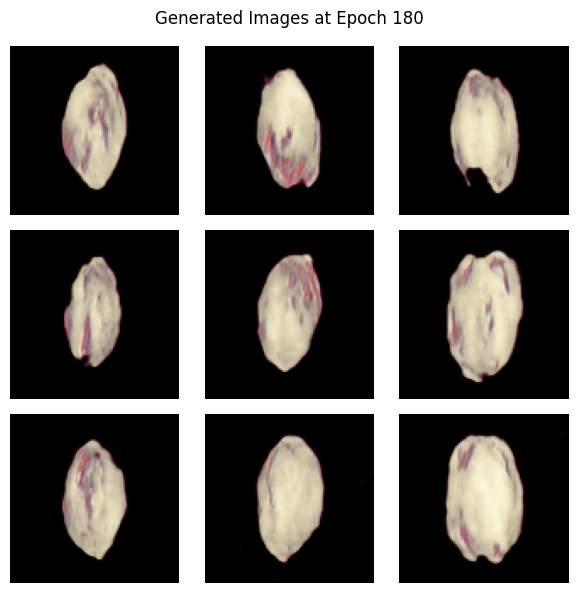

Epoch 181, Generator Loss: 0.9923, Discriminator Loss: 1.2356, Time: 5.97s
Epoch 182, Generator Loss: 1.1138, Discriminator Loss: 1.0213, Time: 6.03s
Epoch 183, Generator Loss: 1.0022, Discriminator Loss: 1.2672, Time: 5.95s
Epoch 184, Generator Loss: 0.9696, Discriminator Loss: 1.4290, Time: 6.03s
Epoch 185, Generator Loss: 1.1384, Discriminator Loss: 1.1675, Time: 6.00s
Epoch 186, Generator Loss: 1.2600, Discriminator Loss: 1.0959, Time: 5.97s
Epoch 187, Generator Loss: 1.1485, Discriminator Loss: 1.1364, Time: 6.00s
Epoch 188, Generator Loss: 1.0819, Discriminator Loss: 1.1284, Time: 5.96s
Epoch 189, Generator Loss: 1.0665, Discriminator Loss: 1.1297, Time: 6.03s
Epoch 190, Generator Loss: 0.8959, Discriminator Loss: 1.3097, Time: 5.98s


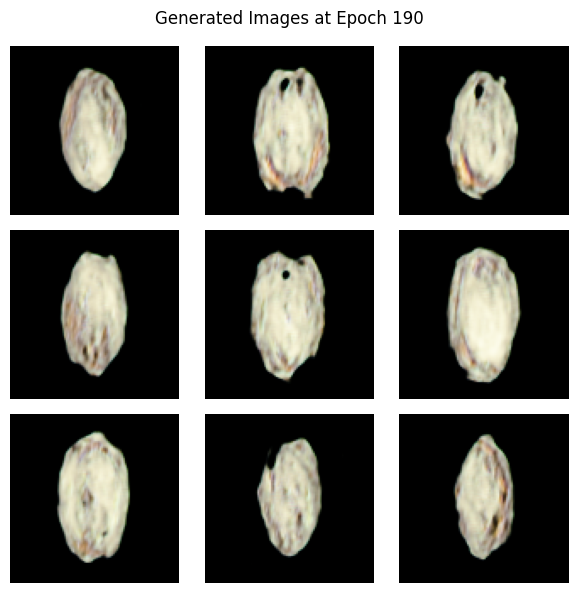

Epoch 191, Generator Loss: 1.2745, Discriminator Loss: 0.8385, Time: 5.95s
Epoch 192, Generator Loss: 1.0110, Discriminator Loss: 1.1134, Time: 5.95s
Epoch 193, Generator Loss: 0.9331, Discriminator Loss: 1.2127, Time: 5.93s
Epoch 194, Generator Loss: 0.8774, Discriminator Loss: 1.2705, Time: 6.07s
Epoch 195, Generator Loss: 0.8798, Discriminator Loss: 1.2114, Time: 5.99s
Epoch 196, Generator Loss: 1.0156, Discriminator Loss: 1.0494, Time: 5.93s
Epoch 197, Generator Loss: 0.8751, Discriminator Loss: 1.3071, Time: 5.96s
Epoch 198, Generator Loss: 1.0238, Discriminator Loss: 1.0678, Time: 5.95s
Epoch 199, Generator Loss: 1.0035, Discriminator Loss: 1.0694, Time: 6.00s
Epoch 200, Generator Loss: 0.9936, Discriminator Loss: 1.0819, Time: 5.96s


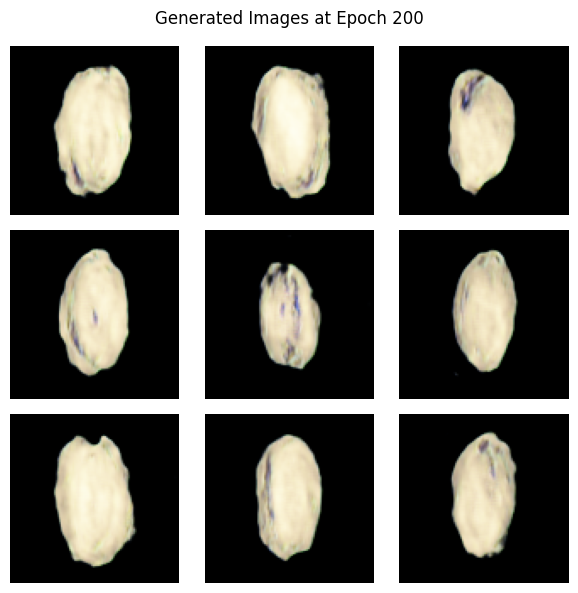

In [69]:
EPOCHS = 200
train(train_dataset, EPOCHS)

Setelah 200 epoch, gen_loss dan disc_loss relatif seimbang karena tidak ada yang dominan (keduanya di kisaran 1.0). gen_loss mendekati 1.0 berarti Generator masih kesulitan menipu Discriminator. disc_loss mendekati 1.0 berarti model juga belum sempurna.

Secara visual, gambar masih blurry/tidak jelas. Hal ini bisa disebabkan oleh dataset yang kecil dan epoch belum banyak.

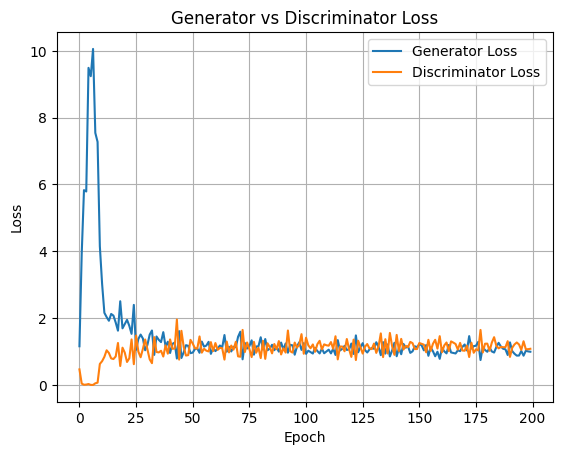

In [70]:
plt.plot(gen_losses, label="Generator Loss")
plt.plot(disc_losses, label="Discriminator Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Generator vs Discriminator Loss")
plt.grid(True)
plt.show()

gen-loss: awalnya tinggi (>10) kemudian turun stabil hingga di epoch 200. Ini berarti Generator semakin baik menipu Discriminator.

disc_loss = awalnya rendah kemudian naik stabil hingga di epoch 200. Ini berarti Discriminator semakin sulit bedakan asli/palsu.

### GAN tuned

In [ ]:
LATENT_DIM_TUNED = 128
BATCH_SIZE_TUNED = 16
gen_lr = 0.0002      
disc_lr = 0.0002
beta_1 = 0.5         
dropout_rate = 0.35

Melakukan tuning terhadap hyperparameter. Beberapa perubahan dan penambahan yang dilakukan yaitu:
- latent dim diubah menjadi 128 untuk memberikan lebih banyak kapasitas untuk representasi noise input Generator
- batch size diubah menjadi 16 untuk memberikan gradient update lebih sering, membantu menghindari mode collapse.
- learning rate generator dan discriminator = 0.0002 untuk mencegah osilasi loss yang ekstrem pada GAN.
- beta_1 untuk optimizer Adam sebesar 0.5 untuk mengurangi momentum dalam update bobot, sehingga model lebih responsif terhadap gradient terbaru.
- dropout_rate menjadi 0.35 untuk mencegah overfitting dengan "mematikan" 35% neuron secara acak selama pelatihan.

In [ ]:
def build_generator_tuned(latent_dim=128):
    model = tf.keras.Sequential(name="Generator_Tuned")
    
    model.add(tf.keras.layers.Dense(100 * 100 * 16, input_dim=LATENT_DIM_TUNED))
    model.add(tf.keras.layers.Reshape((100, 100, 16)))

    model.add(tf.keras.layers.ZeroPadding2D(padding=3))  
    model.add(tf.keras.layers.Conv2D(16, 3, strides=1, padding='valid', activation='relu'))
    model.add(tf.keras.layers.Conv2D(32, 3, strides=1, padding='valid', activation='relu'))
    model.add(tf.keras.layers.Conv2D(64, 3, strides=1, padding='valid', activation='relu'))

    model.add(tf.keras.layers.Conv2D(3, 1, strides=1, padding='valid', activation='tanh'))
    
    return model

In [77]:
def build_discriminator_tuned(dropout_rate=0.35):
    model = tf.keras.Sequential(name="Discriminator_Tuned")
    
    model.add(tf.keras.layers.Conv2D(16, 3, strides=1, padding='valid', activation='relu', input_shape=(100, 100, 3)))
    model.add(tf.keras.layers.Dropout(dropout_rate))

    model.add(tf.keras.layers.Conv2D(32, 3, strides=1, padding='valid', activation='relu'))
    model.add(tf.keras.layers.Dropout(dropout_rate))

    model.add(tf.keras.layers.Conv2D(64, 3, strides=1, padding='valid', activation='relu'))
    model.add(tf.keras.layers.Dropout(dropout_rate))

    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(1, activation='sigmoid'))

    return model

arsitektur model generator dan discriminator sama seperti model baseline

In [ ]:
#optimizer
generator_optimizer_tuned = tf.keras.optimizers.Adam(learning_rate=gen_lr, beta_1=beta_1)
discriminator_optimizer_tuned = tf.keras.optimizers.Adam(learning_rate=disc_lr, beta_1=beta_1)

#model
generator_tuned = build_generator_tuned(latent_dim=LATENT_DIM_TUNED)
discriminator_tuned = build_discriminator_tuned(dropout_rate=dropout_rate)

In [ ]:
def train_step_tuned(images):
    noise = tf.random.normal([tf.shape(images)[0], LATENT_DIM_TUNED])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator_tuned(noise, training=True)

        real_output = discriminator_tuned(images, training=True)
        fake_output = discriminator_tuned(generated_images, training=True)

        gen_loss = cross_entropy(tf.ones_like(fake_output), fake_output)
        disc_loss_real = cross_entropy(tf.ones_like(real_output), real_output)
        disc_loss_fake = cross_entropy(tf.zeros_like(fake_output), fake_output)
        disc_loss = disc_loss_real + disc_loss_fake

    gradients_of_generator = gen_tape.gradient(gen_loss, generator_tuned.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator_tuned.trainable_variables)

    generator_optimizer_tuned.apply_gradients(zip(gradients_of_generator, generator_tuned.trainable_variables))
    discriminator_optimizer_tuned.apply_gradients(zip(gradients_of_discriminator, discriminator_tuned.trainable_variables))

    return gen_loss, disc_loss

In [ ]:
def show_generated_images_tuned(generator_tuned, epoch, n_images=9):
    noise = tf.random.normal([n_images, LATENT_DIM_TUNED])
    generated_images = generator_tuned(noise, training=False)

    generated_images = (generated_images + 1) / 2.0

    plt.figure(figsize=(6, 6))
    for i in range(n_images):
        plt.subplot(3, 3, i + 1)
        plt.imshow(generated_images[i].numpy())
        plt.axis('off')
    plt.suptitle(f"Generated Images at Epoch {epoch+1}")
    plt.tight_layout()
    plt.show()

In [ ]:
gen_losses_tuned = []
disc_losses_tuned = []

def train_tuned(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()

        gen_loss_epoch = 0
        disc_loss_epoch = 0
        num_batches = 0

        for image_batch in dataset:
            g_loss, d_loss = train_step_tuned(image_batch)
            gen_loss_epoch += g_loss
            disc_loss_epoch += d_loss
            num_batches += 1

        avg_g_loss = gen_loss_epoch / num_batches
        avg_d_loss = disc_loss_epoch / num_batches

        gen_losses_tuned.append(avg_g_loss.numpy())
        disc_losses_tuned.append(avg_d_loss.numpy())

        print(f"Epoch {epoch+1}, Generator Loss: {avg_g_loss:.4f}, Discriminator Loss: {avg_d_loss:.4f}, Time: {time.time()-start:.2f}s")

        if (epoch + 1) % 10 == 0:
            show_generated_images_tuned(generator_tuned, epoch)

Epoch 1, Generator Loss: 2.7484, Discriminator Loss: 0.3803, Time: 7.44s
Epoch 2, Generator Loss: 6.1877, Discriminator Loss: 0.0680, Time: 7.39s
Epoch 3, Generator Loss: 3.4549, Discriminator Loss: 1.1012, Time: 7.41s
Epoch 4, Generator Loss: 1.1173, Discriminator Loss: 2.2428, Time: 7.54s
Epoch 5, Generator Loss: 0.9009, Discriminator Loss: 1.4910, Time: 7.42s
Epoch 6, Generator Loss: 0.8519, Discriminator Loss: 1.3748, Time: 7.46s
Epoch 7, Generator Loss: 0.8333, Discriminator Loss: 1.3941, Time: 7.46s
Epoch 8, Generator Loss: 0.8791, Discriminator Loss: 1.3396, Time: 7.53s
Epoch 9, Generator Loss: 0.8491, Discriminator Loss: 1.3458, Time: 7.42s
Epoch 10, Generator Loss: 0.8485, Discriminator Loss: 1.3272, Time: 7.37s


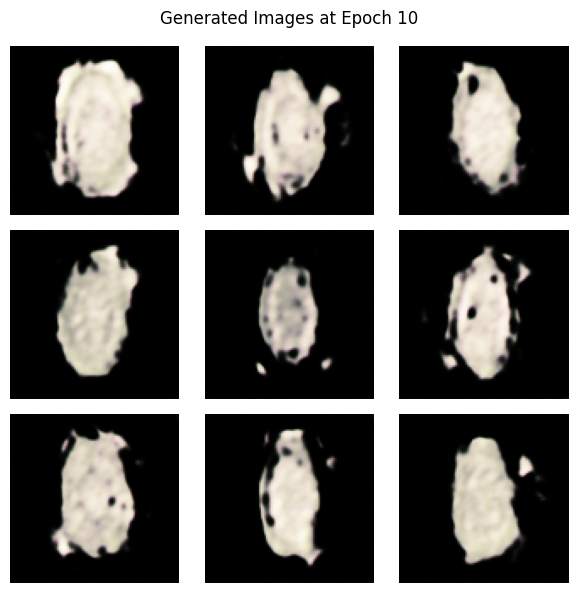

Epoch 11, Generator Loss: 0.8286, Discriminator Loss: 1.3627, Time: 7.41s
Epoch 12, Generator Loss: 0.7632, Discriminator Loss: 1.3863, Time: 7.44s
Epoch 13, Generator Loss: 0.7633, Discriminator Loss: 1.3966, Time: 7.43s
Epoch 14, Generator Loss: 0.7740, Discriminator Loss: 1.3271, Time: 7.43s
Epoch 15, Generator Loss: 0.7950, Discriminator Loss: 1.2964, Time: 7.44s
Epoch 16, Generator Loss: 0.7592, Discriminator Loss: 1.3617, Time: 7.46s
Epoch 17, Generator Loss: 0.8039, Discriminator Loss: 1.3568, Time: 7.58s
Epoch 18, Generator Loss: 0.7716, Discriminator Loss: 1.3160, Time: 7.48s
Epoch 19, Generator Loss: 0.7518, Discriminator Loss: 1.3504, Time: 7.43s
Epoch 20, Generator Loss: 0.7752, Discriminator Loss: 1.3273, Time: 7.43s


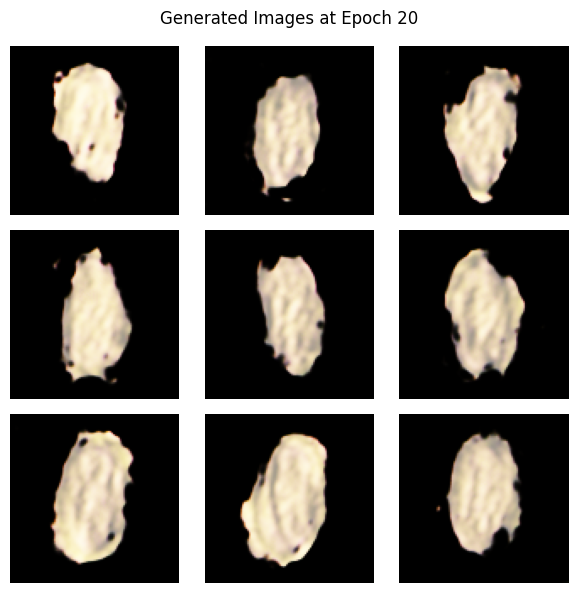

Epoch 21, Generator Loss: 0.7492, Discriminator Loss: 1.3365, Time: 7.49s
Epoch 22, Generator Loss: 0.7519, Discriminator Loss: 1.3677, Time: 7.34s
Epoch 23, Generator Loss: 0.7997, Discriminator Loss: 1.3216, Time: 7.43s
Epoch 24, Generator Loss: 0.7880, Discriminator Loss: 1.2826, Time: 7.46s
Epoch 25, Generator Loss: 0.7751, Discriminator Loss: 1.3099, Time: 7.53s
Epoch 26, Generator Loss: 0.7878, Discriminator Loss: 1.3275, Time: 7.45s
Epoch 27, Generator Loss: 0.7871, Discriminator Loss: 1.3178, Time: 7.41s
Epoch 28, Generator Loss: 0.7895, Discriminator Loss: 1.3143, Time: 7.45s
Epoch 29, Generator Loss: 0.7849, Discriminator Loss: 1.3377, Time: 7.51s
Epoch 30, Generator Loss: 0.7416, Discriminator Loss: 1.3723, Time: 7.32s


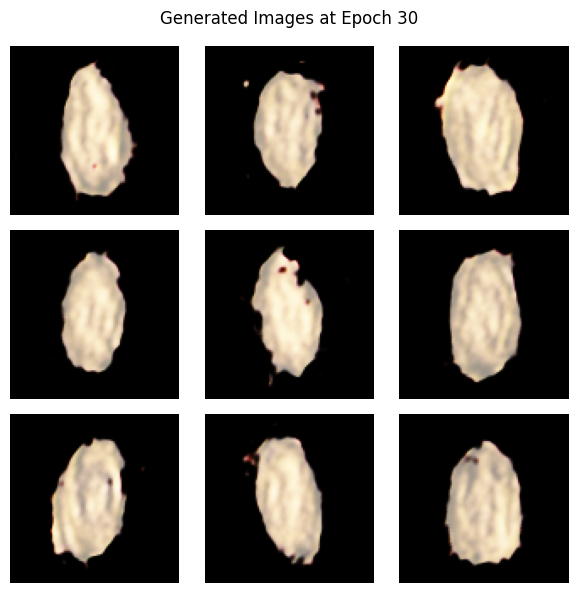

Epoch 31, Generator Loss: 0.7798, Discriminator Loss: 1.3028, Time: 7.36s
Epoch 32, Generator Loss: 0.8116, Discriminator Loss: 1.2931, Time: 7.39s
Epoch 33, Generator Loss: 0.7648, Discriminator Loss: 1.3174, Time: 7.40s
Epoch 34, Generator Loss: 0.7794, Discriminator Loss: 1.3387, Time: 7.34s
Epoch 35, Generator Loss: 0.8048, Discriminator Loss: 1.2918, Time: 7.35s
Epoch 36, Generator Loss: 0.8112, Discriminator Loss: 1.2793, Time: 7.34s
Epoch 37, Generator Loss: 0.8078, Discriminator Loss: 1.2860, Time: 7.38s
Epoch 38, Generator Loss: 0.8356, Discriminator Loss: 1.2613, Time: 7.41s
Epoch 39, Generator Loss: 0.8459, Discriminator Loss: 1.2675, Time: 7.36s
Epoch 40, Generator Loss: 0.8609, Discriminator Loss: 1.2024, Time: 7.36s


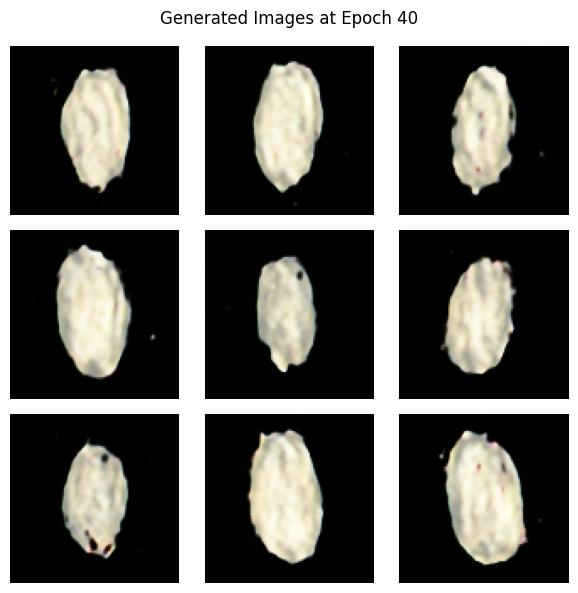

Epoch 41, Generator Loss: 0.8757, Discriminator Loss: 1.2465, Time: 7.36s
Epoch 42, Generator Loss: 0.9106, Discriminator Loss: 1.2660, Time: 7.43s
Epoch 43, Generator Loss: 0.8763, Discriminator Loss: 1.2455, Time: 7.40s
Epoch 44, Generator Loss: 0.8759, Discriminator Loss: 1.1742, Time: 7.43s
Epoch 45, Generator Loss: 0.8712, Discriminator Loss: 1.2051, Time: 7.36s
Epoch 46, Generator Loss: 0.9207, Discriminator Loss: 1.2177, Time: 7.48s
Epoch 47, Generator Loss: 0.8572, Discriminator Loss: 1.2529, Time: 7.37s
Epoch 48, Generator Loss: 0.8207, Discriminator Loss: 1.3394, Time: 7.41s
Epoch 49, Generator Loss: 0.8041, Discriminator Loss: 1.3162, Time: 7.38s
Epoch 50, Generator Loss: 0.7725, Discriminator Loss: 1.3385, Time: 7.43s


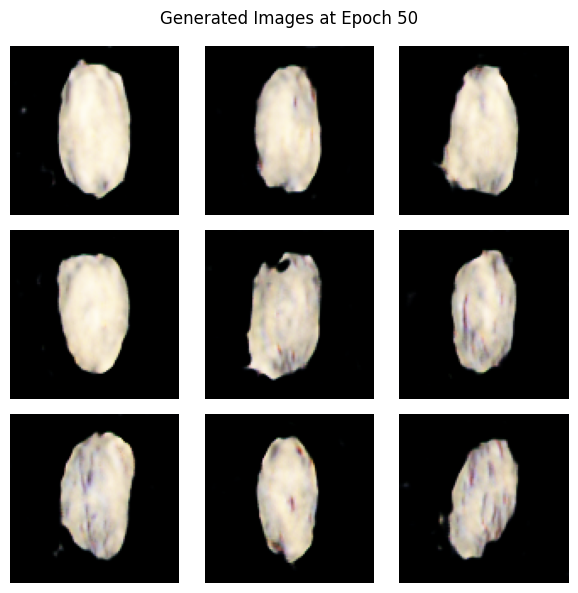

Epoch 51, Generator Loss: 0.7708, Discriminator Loss: 1.3286, Time: 7.36s
Epoch 52, Generator Loss: 0.7675, Discriminator Loss: 1.3543, Time: 7.36s
Epoch 53, Generator Loss: 0.7732, Discriminator Loss: 1.3327, Time: 7.31s
Epoch 54, Generator Loss: 0.7789, Discriminator Loss: 1.3141, Time: 7.35s
Epoch 55, Generator Loss: 0.7693, Discriminator Loss: 1.3242, Time: 7.44s
Epoch 56, Generator Loss: 0.7818, Discriminator Loss: 1.3197, Time: 7.35s
Epoch 57, Generator Loss: 0.7899, Discriminator Loss: 1.3039, Time: 7.36s
Epoch 58, Generator Loss: 0.7973, Discriminator Loss: 1.3007, Time: 7.35s
Epoch 59, Generator Loss: 0.7953, Discriminator Loss: 1.2914, Time: 7.42s
Epoch 60, Generator Loss: 0.7986, Discriminator Loss: 1.3001, Time: 7.33s


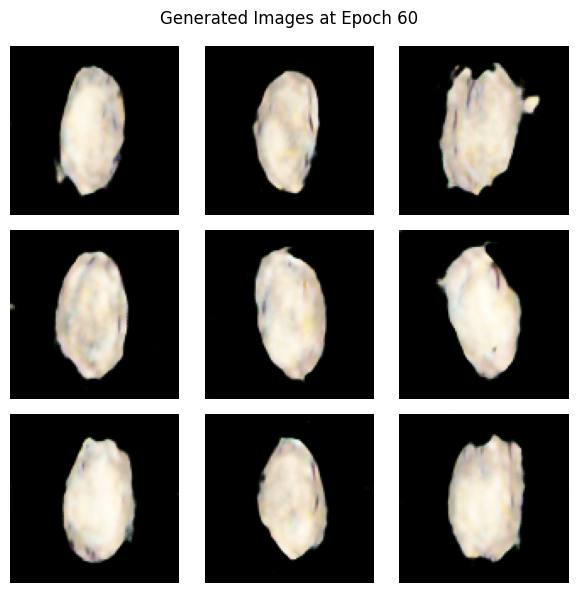

Epoch 61, Generator Loss: 0.7902, Discriminator Loss: 1.2952, Time: 7.40s
Epoch 62, Generator Loss: 0.7848, Discriminator Loss: 1.2972, Time: 7.41s
Epoch 63, Generator Loss: 0.7842, Discriminator Loss: 1.3078, Time: 7.45s
Epoch 64, Generator Loss: 0.7864, Discriminator Loss: 1.2899, Time: 7.42s
Epoch 65, Generator Loss: 0.8022, Discriminator Loss: 1.2780, Time: 7.41s
Epoch 66, Generator Loss: 0.8087, Discriminator Loss: 1.2724, Time: 7.34s
Epoch 67, Generator Loss: 0.8239, Discriminator Loss: 1.2686, Time: 7.37s
Epoch 68, Generator Loss: 0.8042, Discriminator Loss: 1.2747, Time: 7.35s
Epoch 69, Generator Loss: 0.8112, Discriminator Loss: 1.2689, Time: 7.37s
Epoch 70, Generator Loss: 0.8139, Discriminator Loss: 1.2748, Time: 7.42s


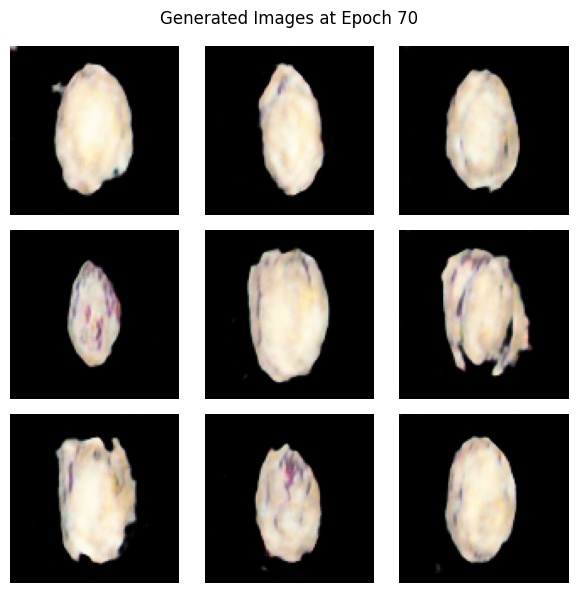

Epoch 71, Generator Loss: 0.8102, Discriminator Loss: 1.2809, Time: 7.31s
Epoch 72, Generator Loss: 0.8130, Discriminator Loss: 1.2944, Time: 7.33s
Epoch 73, Generator Loss: 0.8244, Discriminator Loss: 1.2834, Time: 7.32s
Epoch 74, Generator Loss: 0.8324, Discriminator Loss: 1.2483, Time: 7.33s
Epoch 75, Generator Loss: 0.8582, Discriminator Loss: 1.2719, Time: 7.33s
Epoch 76, Generator Loss: 0.8443, Discriminator Loss: 1.2389, Time: 7.34s
Epoch 77, Generator Loss: 0.8191, Discriminator Loss: 1.3137, Time: 7.32s
Epoch 78, Generator Loss: 0.8682, Discriminator Loss: 1.2770, Time: 7.29s
Epoch 79, Generator Loss: 0.8748, Discriminator Loss: 1.2167, Time: 7.36s
Epoch 80, Generator Loss: 0.8713, Discriminator Loss: 1.2373, Time: 7.47s


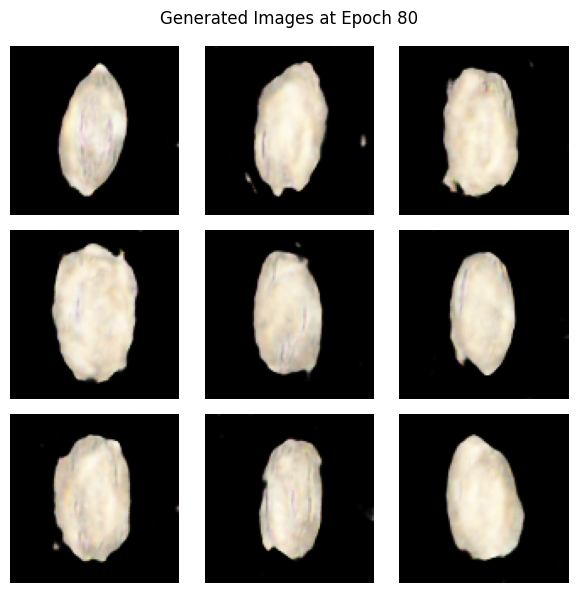

Epoch 81, Generator Loss: 0.8829, Discriminator Loss: 1.2912, Time: 7.38s
Epoch 82, Generator Loss: 0.8742, Discriminator Loss: 1.2214, Time: 7.36s
Epoch 83, Generator Loss: 0.8937, Discriminator Loss: 1.2420, Time: 7.35s
Epoch 84, Generator Loss: 0.9014, Discriminator Loss: 1.2175, Time: 7.37s
Epoch 85, Generator Loss: 0.8930, Discriminator Loss: 1.2064, Time: 7.33s
Epoch 86, Generator Loss: 0.8679, Discriminator Loss: 1.2648, Time: 7.35s
Epoch 87, Generator Loss: 0.8200, Discriminator Loss: 1.2709, Time: 7.30s
Epoch 88, Generator Loss: 0.8096, Discriminator Loss: 1.2837, Time: 7.29s
Epoch 89, Generator Loss: 0.8068, Discriminator Loss: 1.2918, Time: 7.37s
Epoch 90, Generator Loss: 0.8028, Discriminator Loss: 1.2875, Time: 7.23s


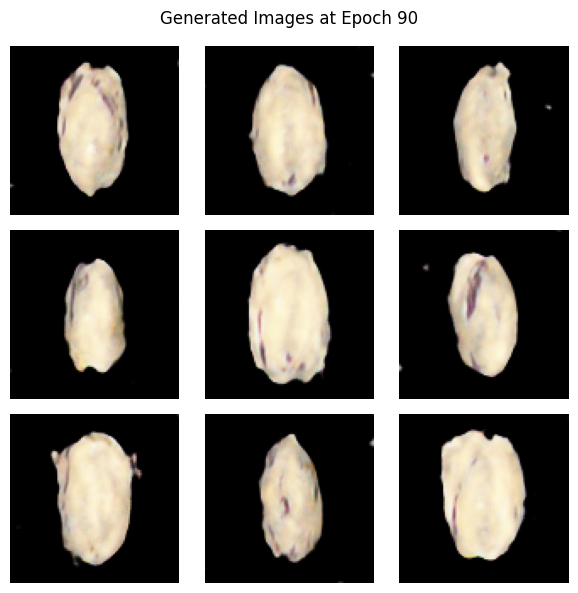

Epoch 91, Generator Loss: 0.7949, Discriminator Loss: 1.2967, Time: 7.21s
Epoch 92, Generator Loss: 0.8127, Discriminator Loss: 1.2693, Time: 7.26s
Epoch 93, Generator Loss: 0.8109, Discriminator Loss: 1.2723, Time: 7.34s
Epoch 94, Generator Loss: 0.8138, Discriminator Loss: 1.2673, Time: 7.29s
Epoch 95, Generator Loss: 0.8123, Discriminator Loss: 1.2674, Time: 7.31s
Epoch 96, Generator Loss: 0.8143, Discriminator Loss: 1.2685, Time: 7.29s
Epoch 97, Generator Loss: 0.8058, Discriminator Loss: 1.2814, Time: 7.38s
Epoch 98, Generator Loss: 0.8200, Discriminator Loss: 1.2539, Time: 7.21s
Epoch 99, Generator Loss: 0.8256, Discriminator Loss: 1.2625, Time: 7.19s
Epoch 100, Generator Loss: 0.8289, Discriminator Loss: 1.2628, Time: 7.20s


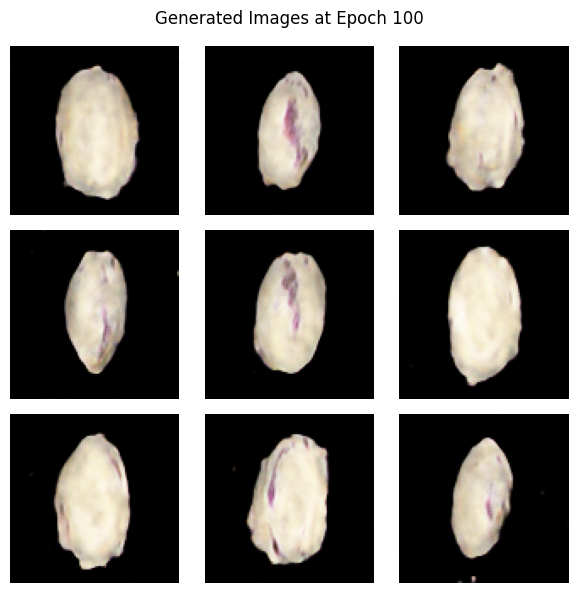

Epoch 101, Generator Loss: 0.8122, Discriminator Loss: 1.2621, Time: 7.27s
Epoch 102, Generator Loss: 0.8132, Discriminator Loss: 1.2815, Time: 7.30s
Epoch 103, Generator Loss: 0.8172, Discriminator Loss: 1.2677, Time: 7.23s
Epoch 104, Generator Loss: 0.8411, Discriminator Loss: 1.2704, Time: 7.33s
Epoch 105, Generator Loss: 0.8361, Discriminator Loss: 1.2616, Time: 7.29s
Epoch 106, Generator Loss: 0.8159, Discriminator Loss: 1.2778, Time: 7.39s
Epoch 107, Generator Loss: 0.8038, Discriminator Loss: 1.2793, Time: 7.28s
Epoch 108, Generator Loss: 0.8168, Discriminator Loss: 1.2752, Time: 7.27s
Epoch 109, Generator Loss: 0.8051, Discriminator Loss: 1.2816, Time: 7.27s
Epoch 110, Generator Loss: 0.8145, Discriminator Loss: 1.2717, Time: 7.32s


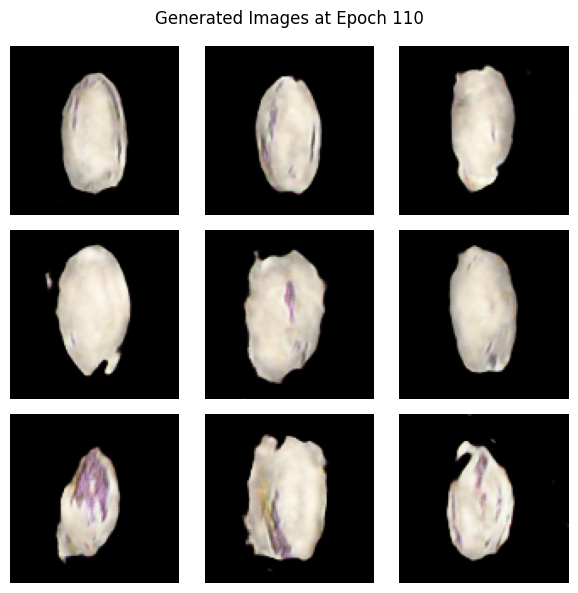

Epoch 111, Generator Loss: 0.8192, Discriminator Loss: 1.2621, Time: 7.35s
Epoch 112, Generator Loss: 0.8149, Discriminator Loss: 1.2713, Time: 7.39s
Epoch 113, Generator Loss: 0.8169, Discriminator Loss: 1.2640, Time: 7.35s
Epoch 114, Generator Loss: 0.8165, Discriminator Loss: 1.2743, Time: 7.33s
Epoch 115, Generator Loss: 0.8227, Discriminator Loss: 1.2674, Time: 7.27s
Epoch 116, Generator Loss: 0.8227, Discriminator Loss: 1.2585, Time: 7.27s
Epoch 117, Generator Loss: 0.8202, Discriminator Loss: 1.2617, Time: 7.28s
Epoch 118, Generator Loss: 0.8133, Discriminator Loss: 1.2822, Time: 7.32s
Epoch 119, Generator Loss: 0.8159, Discriminator Loss: 1.2612, Time: 7.37s
Epoch 120, Generator Loss: 0.8293, Discriminator Loss: 1.2582, Time: 7.27s


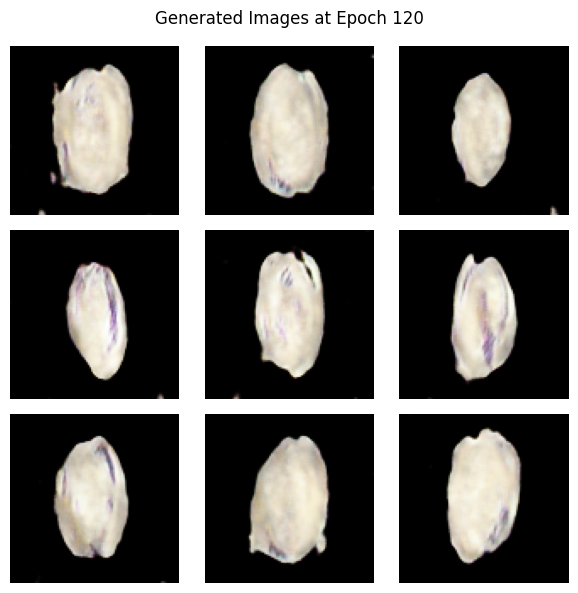

Epoch 121, Generator Loss: 0.8256, Discriminator Loss: 1.2659, Time: 7.29s
Epoch 122, Generator Loss: 0.8171, Discriminator Loss: 1.2668, Time: 7.32s
Epoch 123, Generator Loss: 0.8326, Discriminator Loss: 1.2474, Time: 7.42s
Epoch 124, Generator Loss: 0.8225, Discriminator Loss: 1.2675, Time: 7.36s
Epoch 125, Generator Loss: 0.8239, Discriminator Loss: 1.2729, Time: 7.33s
Epoch 126, Generator Loss: 0.8191, Discriminator Loss: 1.2694, Time: 7.35s
Epoch 127, Generator Loss: 0.8077, Discriminator Loss: 1.2789, Time: 7.38s
Epoch 128, Generator Loss: 0.8180, Discriminator Loss: 1.2694, Time: 7.29s
Epoch 129, Generator Loss: 0.8220, Discriminator Loss: 1.2663, Time: 7.26s
Epoch 130, Generator Loss: 0.8213, Discriminator Loss: 1.2716, Time: 7.28s


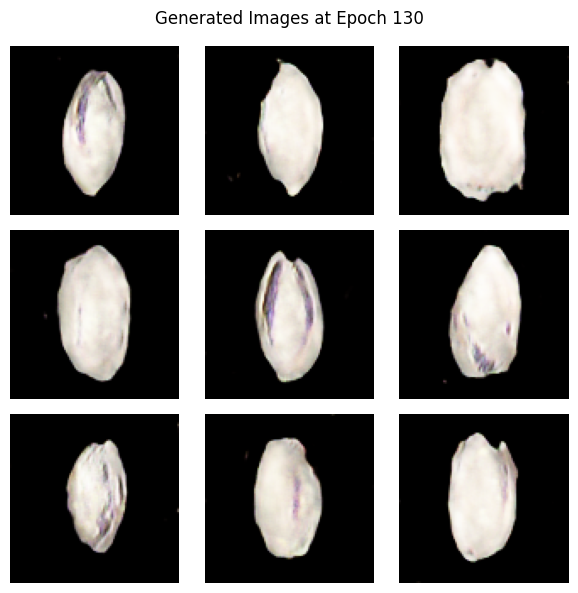

Epoch 131, Generator Loss: 0.8167, Discriminator Loss: 1.2704, Time: 7.32s
Epoch 132, Generator Loss: 0.8149, Discriminator Loss: 1.2725, Time: 7.28s
Epoch 133, Generator Loss: 0.8195, Discriminator Loss: 1.2555, Time: 7.35s
Epoch 134, Generator Loss: 0.8222, Discriminator Loss: 1.2769, Time: 7.36s
Epoch 135, Generator Loss: 0.8115, Discriminator Loss: 1.2684, Time: 7.26s
Epoch 136, Generator Loss: 0.8341, Discriminator Loss: 1.2542, Time: 7.37s
Epoch 137, Generator Loss: 0.8236, Discriminator Loss: 1.2694, Time: 7.25s
Epoch 138, Generator Loss: 0.8278, Discriminator Loss: 1.2548, Time: 7.27s
Epoch 139, Generator Loss: 0.8188, Discriminator Loss: 1.2543, Time: 7.31s
Epoch 140, Generator Loss: 0.8323, Discriminator Loss: 1.2640, Time: 7.37s


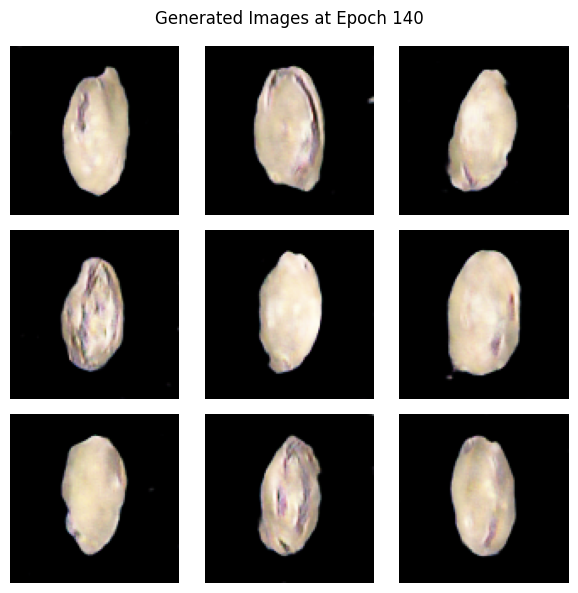

Epoch 141, Generator Loss: 0.8101, Discriminator Loss: 1.2700, Time: 7.33s
Epoch 142, Generator Loss: 0.8241, Discriminator Loss: 1.2510, Time: 7.33s
Epoch 143, Generator Loss: 0.8377, Discriminator Loss: 1.2514, Time: 7.26s
Epoch 144, Generator Loss: 0.8215, Discriminator Loss: 1.2625, Time: 7.35s
Epoch 145, Generator Loss: 0.8379, Discriminator Loss: 1.2574, Time: 7.27s
Epoch 146, Generator Loss: 0.8405, Discriminator Loss: 1.2457, Time: 7.26s
Epoch 147, Generator Loss: 0.8235, Discriminator Loss: 1.2645, Time: 7.33s
Epoch 148, Generator Loss: 0.8340, Discriminator Loss: 1.2446, Time: 7.24s
Epoch 149, Generator Loss: 0.8331, Discriminator Loss: 1.2479, Time: 7.38s
Epoch 150, Generator Loss: 0.8399, Discriminator Loss: 1.2390, Time: 7.38s


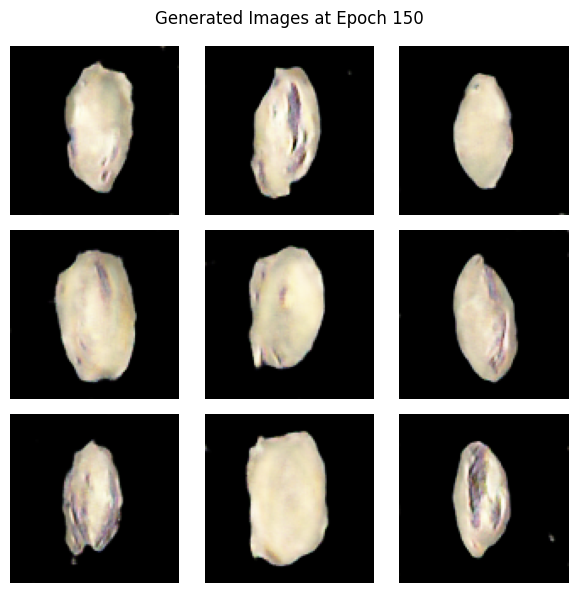

Epoch 151, Generator Loss: 0.8353, Discriminator Loss: 1.2531, Time: 7.40s
Epoch 152, Generator Loss: 0.8472, Discriminator Loss: 1.2307, Time: 7.41s
Epoch 153, Generator Loss: 0.8560, Discriminator Loss: 1.2363, Time: 7.48s
Epoch 154, Generator Loss: 0.8412, Discriminator Loss: 1.2358, Time: 7.42s
Epoch 155, Generator Loss: 0.8464, Discriminator Loss: 1.2383, Time: 7.36s
Epoch 156, Generator Loss: 0.8601, Discriminator Loss: 1.2496, Time: 7.25s
Epoch 157, Generator Loss: 0.8315, Discriminator Loss: 1.2449, Time: 7.33s
Epoch 158, Generator Loss: 0.8448, Discriminator Loss: 1.2400, Time: 7.27s
Epoch 159, Generator Loss: 0.8636, Discriminator Loss: 1.2244, Time: 7.26s
Epoch 160, Generator Loss: 0.8525, Discriminator Loss: 1.2168, Time: 7.25s


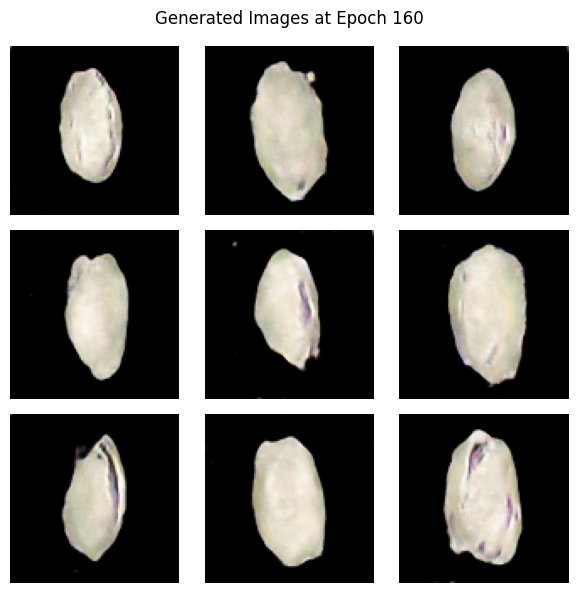

Epoch 161, Generator Loss: 0.8593, Discriminator Loss: 1.2387, Time: 7.32s
Epoch 162, Generator Loss: 0.8394, Discriminator Loss: 1.2445, Time: 7.25s
Epoch 163, Generator Loss: 0.8509, Discriminator Loss: 1.2296, Time: 7.26s
Epoch 164, Generator Loss: 0.8673, Discriminator Loss: 1.2120, Time: 7.29s
Epoch 165, Generator Loss: 0.8745, Discriminator Loss: 1.2252, Time: 7.29s
Epoch 166, Generator Loss: 0.8605, Discriminator Loss: 1.2261, Time: 7.34s
Epoch 167, Generator Loss: 0.8513, Discriminator Loss: 1.2294, Time: 7.23s
Epoch 168, Generator Loss: 0.8667, Discriminator Loss: 1.2241, Time: 7.25s
Epoch 169, Generator Loss: 0.8603, Discriminator Loss: 1.2281, Time: 7.32s
Epoch 170, Generator Loss: 0.8600, Discriminator Loss: 1.2324, Time: 7.32s


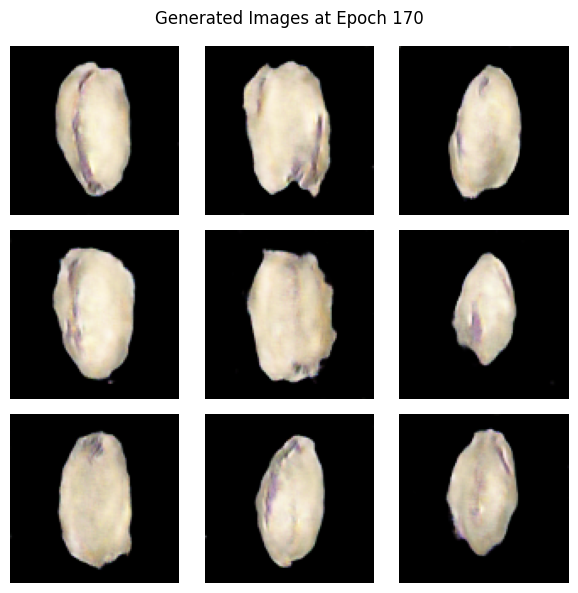

Epoch 171, Generator Loss: 0.8728, Discriminator Loss: 1.2169, Time: 7.27s
Epoch 172, Generator Loss: 0.8652, Discriminator Loss: 1.2068, Time: 7.35s
Epoch 173, Generator Loss: 0.8652, Discriminator Loss: 1.2251, Time: 7.29s
Epoch 174, Generator Loss: 0.8862, Discriminator Loss: 1.2118, Time: 7.37s
Epoch 175, Generator Loss: 0.8729, Discriminator Loss: 1.2246, Time: 7.31s
Epoch 176, Generator Loss: 0.8714, Discriminator Loss: 1.2108, Time: 7.27s
Epoch 177, Generator Loss: 0.8594, Discriminator Loss: 1.2176, Time: 7.31s
Epoch 178, Generator Loss: 0.8868, Discriminator Loss: 1.1888, Time: 7.36s
Epoch 179, Generator Loss: 0.8907, Discriminator Loss: 1.2055, Time: 7.34s
Epoch 180, Generator Loss: 0.8768, Discriminator Loss: 1.2070, Time: 7.31s


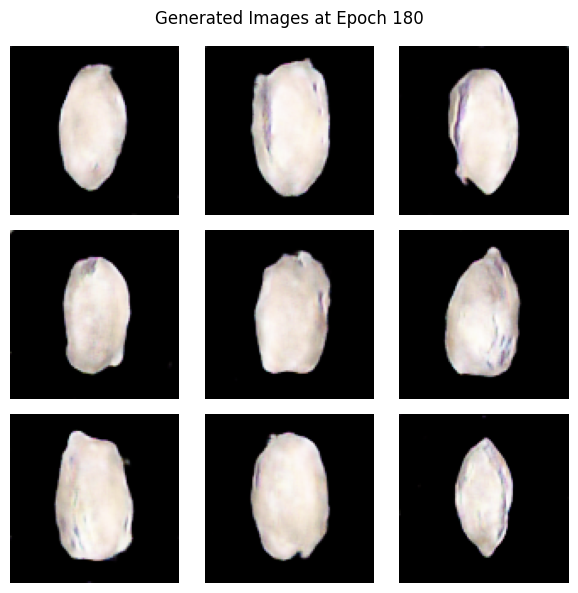

Epoch 181, Generator Loss: 0.8975, Discriminator Loss: 1.1861, Time: 7.38s
Epoch 182, Generator Loss: 0.9024, Discriminator Loss: 1.1816, Time: 7.35s
Epoch 183, Generator Loss: 0.8918, Discriminator Loss: 1.1809, Time: 7.47s
Epoch 184, Generator Loss: 0.9094, Discriminator Loss: 1.1997, Time: 7.34s
Epoch 185, Generator Loss: 0.8860, Discriminator Loss: 1.1942, Time: 7.31s
Epoch 186, Generator Loss: 0.9031, Discriminator Loss: 1.1985, Time: 7.35s
Epoch 187, Generator Loss: 0.9256, Discriminator Loss: 1.1840, Time: 7.47s
Epoch 188, Generator Loss: 0.9446, Discriminator Loss: 1.1789, Time: 7.35s
Epoch 189, Generator Loss: 0.9454, Discriminator Loss: 1.1530, Time: 7.40s
Epoch 190, Generator Loss: 0.9135, Discriminator Loss: 1.1799, Time: 7.39s


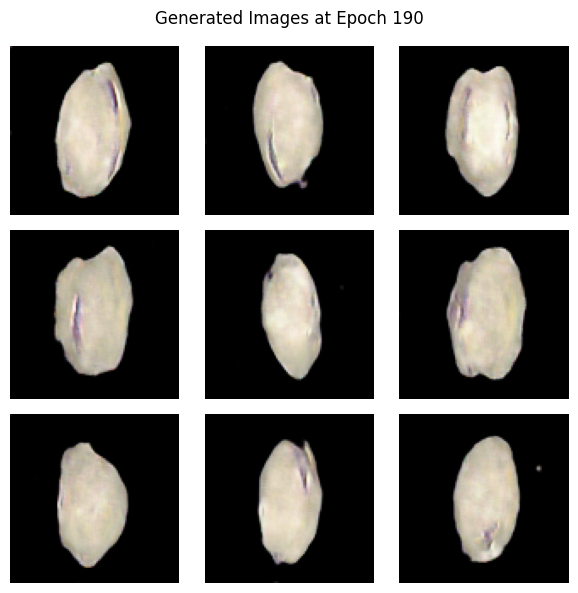

Epoch 191, Generator Loss: 0.9213, Discriminator Loss: 1.1797, Time: 7.43s
Epoch 192, Generator Loss: 0.9100, Discriminator Loss: 1.1724, Time: 7.35s
Epoch 193, Generator Loss: 0.9007, Discriminator Loss: 1.1774, Time: 7.37s
Epoch 194, Generator Loss: 0.9343, Discriminator Loss: 1.1667, Time: 7.34s
Epoch 195, Generator Loss: 0.9116, Discriminator Loss: 1.1726, Time: 7.43s
Epoch 196, Generator Loss: 0.9238, Discriminator Loss: 1.1613, Time: 7.44s
Epoch 197, Generator Loss: 0.9320, Discriminator Loss: 1.1791, Time: 7.38s
Epoch 198, Generator Loss: 0.9527, Discriminator Loss: 1.1460, Time: 7.38s
Epoch 199, Generator Loss: 0.9435, Discriminator Loss: 1.1635, Time: 7.37s
Epoch 200, Generator Loss: 0.9193, Discriminator Loss: 1.1700, Time: 7.43s


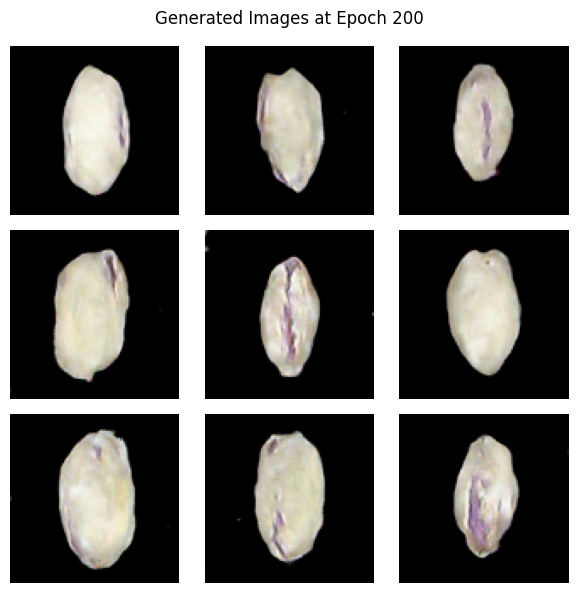

Epoch 201, Generator Loss: 0.9339, Discriminator Loss: 1.1664, Time: 7.30s
Epoch 202, Generator Loss: 0.9368, Discriminator Loss: 1.1483, Time: 7.35s
Epoch 203, Generator Loss: 0.9439, Discriminator Loss: 1.1504, Time: 7.33s
Epoch 204, Generator Loss: 0.9417, Discriminator Loss: 1.1570, Time: 7.30s
Epoch 205, Generator Loss: 0.9424, Discriminator Loss: 1.1354, Time: 7.23s
Epoch 206, Generator Loss: 0.9641, Discriminator Loss: 1.1371, Time: 7.27s
Epoch 207, Generator Loss: 0.9639, Discriminator Loss: 1.1258, Time: 7.24s
Epoch 208, Generator Loss: 0.9590, Discriminator Loss: 1.1513, Time: 7.31s
Epoch 209, Generator Loss: 0.9577, Discriminator Loss: 1.1385, Time: 7.25s
Epoch 210, Generator Loss: 0.9678, Discriminator Loss: 1.1420, Time: 7.23s


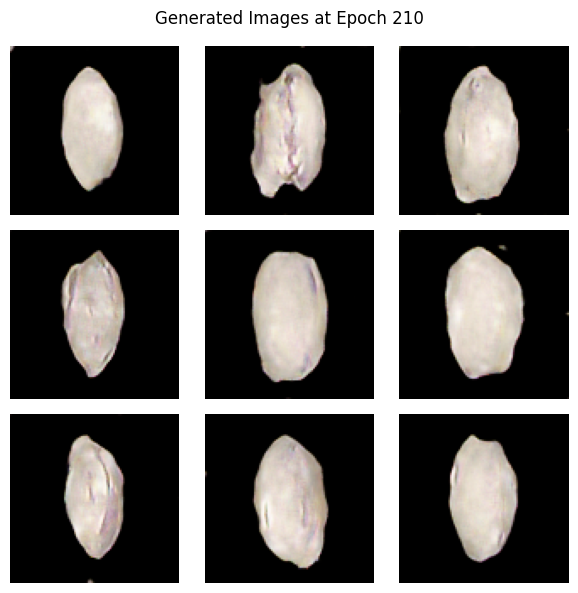

Epoch 211, Generator Loss: 0.9763, Discriminator Loss: 1.1544, Time: 7.31s
Epoch 212, Generator Loss: 0.9699, Discriminator Loss: 1.1236, Time: 7.35s
Epoch 213, Generator Loss: 0.9643, Discriminator Loss: 1.1248, Time: 7.41s
Epoch 214, Generator Loss: 0.9622, Discriminator Loss: 1.1294, Time: 7.27s
Epoch 215, Generator Loss: 0.9793, Discriminator Loss: 1.1188, Time: 7.27s
Epoch 216, Generator Loss: 1.0244, Discriminator Loss: 1.1161, Time: 7.21s
Epoch 217, Generator Loss: 0.9711, Discriminator Loss: 1.1366, Time: 7.31s
Epoch 218, Generator Loss: 0.9611, Discriminator Loss: 1.1181, Time: 7.24s
Epoch 219, Generator Loss: 0.9822, Discriminator Loss: 1.1167, Time: 7.32s
Epoch 220, Generator Loss: 0.9834, Discriminator Loss: 1.1090, Time: 7.26s


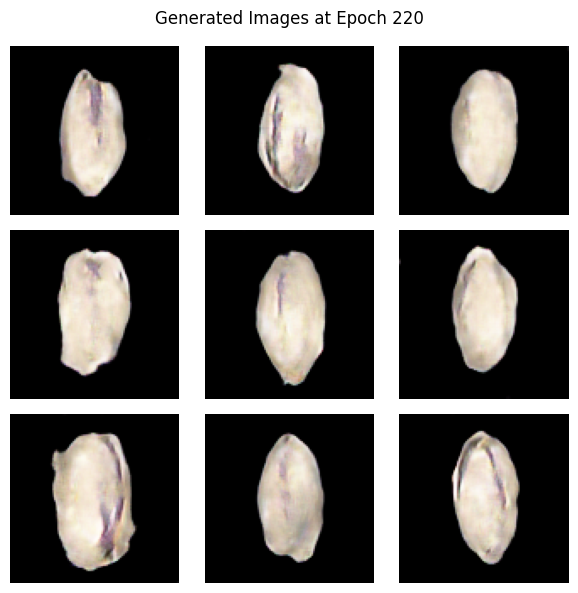

Epoch 221, Generator Loss: 0.9842, Discriminator Loss: 1.1104, Time: 7.41s
Epoch 222, Generator Loss: 1.0082, Discriminator Loss: 1.1110, Time: 7.22s
Epoch 223, Generator Loss: 0.9968, Discriminator Loss: 1.1176, Time: 7.29s
Epoch 224, Generator Loss: 0.9681, Discriminator Loss: 1.1299, Time: 7.34s
Epoch 225, Generator Loss: 1.0092, Discriminator Loss: 1.0953, Time: 7.33s
Epoch 226, Generator Loss: 1.0409, Discriminator Loss: 1.1001, Time: 7.25s
Epoch 227, Generator Loss: 1.0205, Discriminator Loss: 1.0803, Time: 7.21s
Epoch 228, Generator Loss: 1.0162, Discriminator Loss: 1.1020, Time: 7.26s
Epoch 229, Generator Loss: 1.0675, Discriminator Loss: 1.0528, Time: 7.25s
Epoch 230, Generator Loss: 1.0157, Discriminator Loss: 1.1151, Time: 7.29s


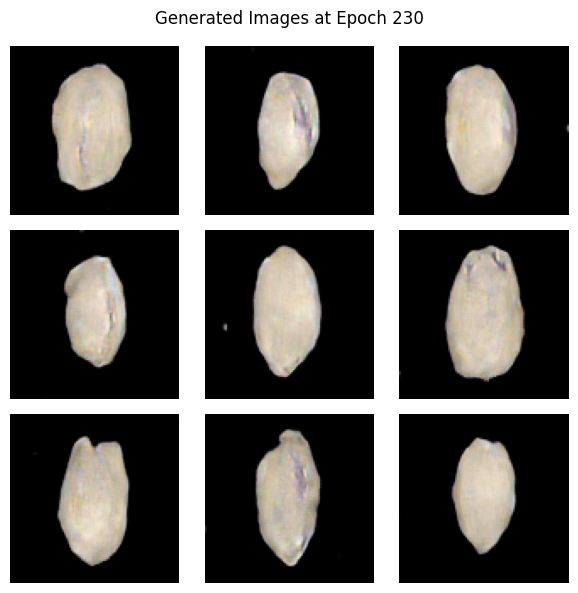

Epoch 231, Generator Loss: 1.0092, Discriminator Loss: 1.0962, Time: 7.27s
Epoch 232, Generator Loss: 1.0360, Discriminator Loss: 1.0874, Time: 7.26s
Epoch 233, Generator Loss: 1.0083, Discriminator Loss: 1.0907, Time: 7.39s
Epoch 234, Generator Loss: 1.0205, Discriminator Loss: 1.0985, Time: 7.39s
Epoch 235, Generator Loss: 1.0492, Discriminator Loss: 1.0885, Time: 7.32s
Epoch 236, Generator Loss: 1.0242, Discriminator Loss: 1.0779, Time: 7.33s
Epoch 237, Generator Loss: 1.0195, Discriminator Loss: 1.0719, Time: 7.25s
Epoch 238, Generator Loss: 1.0496, Discriminator Loss: 1.0874, Time: 7.38s
Epoch 239, Generator Loss: 1.0669, Discriminator Loss: 1.0584, Time: 7.27s
Epoch 240, Generator Loss: 1.0533, Discriminator Loss: 1.0492, Time: 7.25s


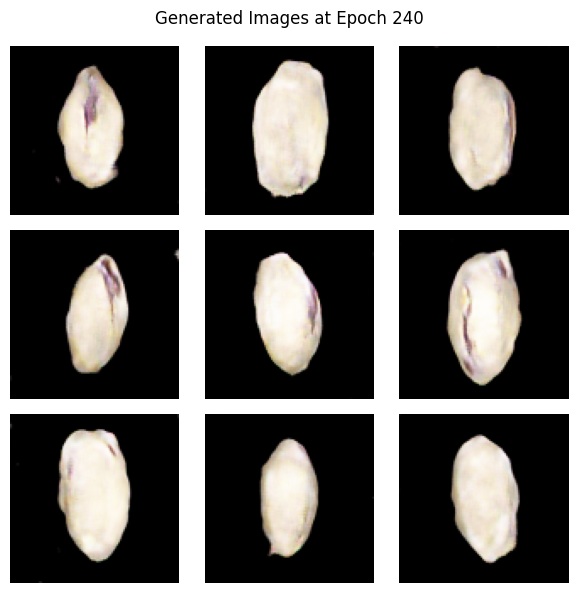

Epoch 241, Generator Loss: 1.0393, Discriminator Loss: 1.0971, Time: 7.29s
Epoch 242, Generator Loss: 1.0364, Discriminator Loss: 1.0834, Time: 7.30s
Epoch 243, Generator Loss: 1.0378, Discriminator Loss: 1.0653, Time: 7.28s
Epoch 244, Generator Loss: 1.0442, Discriminator Loss: 1.0824, Time: 7.27s
Epoch 245, Generator Loss: 1.0334, Discriminator Loss: 1.0906, Time: 7.27s
Epoch 246, Generator Loss: 1.0427, Discriminator Loss: 1.0607, Time: 7.21s
Epoch 247, Generator Loss: 1.0710, Discriminator Loss: 1.0479, Time: 7.33s
Epoch 248, Generator Loss: 1.1043, Discriminator Loss: 1.0415, Time: 7.28s
Epoch 249, Generator Loss: 1.0456, Discriminator Loss: 1.0716, Time: 7.25s
Epoch 250, Generator Loss: 1.0694, Discriminator Loss: 1.0397, Time: 7.27s


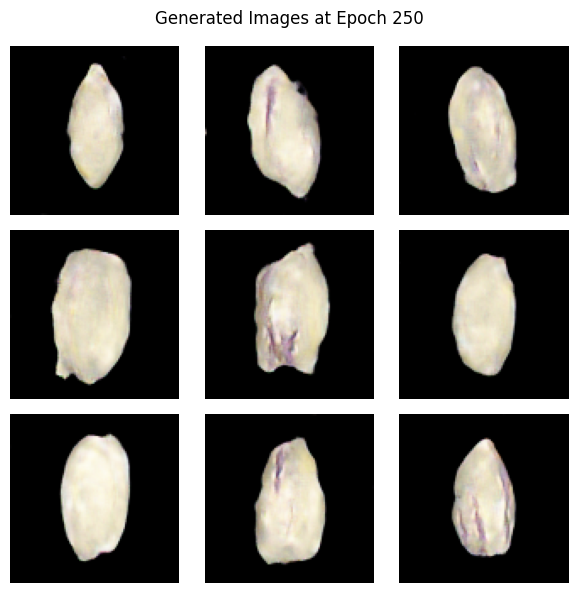

Epoch 251, Generator Loss: 1.0818, Discriminator Loss: 1.0766, Time: 7.35s
Epoch 252, Generator Loss: 1.0497, Discriminator Loss: 1.0576, Time: 7.24s
Epoch 253, Generator Loss: 1.0612, Discriminator Loss: 1.0645, Time: 7.25s
Epoch 254, Generator Loss: 1.0639, Discriminator Loss: 1.0445, Time: 7.25s
Epoch 255, Generator Loss: 1.0670, Discriminator Loss: 1.0598, Time: 7.30s
Epoch 256, Generator Loss: 1.0735, Discriminator Loss: 1.0558, Time: 7.25s
Epoch 257, Generator Loss: 1.1166, Discriminator Loss: 1.0485, Time: 7.24s
Epoch 258, Generator Loss: 1.0666, Discriminator Loss: 1.0463, Time: 7.27s
Epoch 259, Generator Loss: 1.0844, Discriminator Loss: 1.0296, Time: 7.27s
Epoch 260, Generator Loss: 1.1061, Discriminator Loss: 1.0586, Time: 7.33s


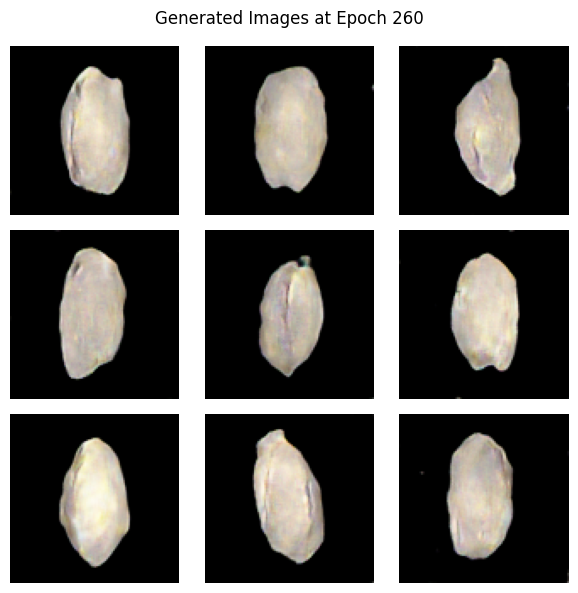

Epoch 261, Generator Loss: 1.1112, Discriminator Loss: 1.0364, Time: 7.24s
Epoch 262, Generator Loss: 1.1175, Discriminator Loss: 1.0300, Time: 7.26s
Epoch 263, Generator Loss: 1.0833, Discriminator Loss: 1.0412, Time: 7.24s
Epoch 264, Generator Loss: 1.1208, Discriminator Loss: 1.0360, Time: 7.32s
Epoch 265, Generator Loss: 1.0841, Discriminator Loss: 1.0572, Time: 7.24s
Epoch 266, Generator Loss: 1.1364, Discriminator Loss: 0.9994, Time: 7.30s
Epoch 267, Generator Loss: 1.1120, Discriminator Loss: 1.0478, Time: 7.27s
Epoch 268, Generator Loss: 1.0963, Discriminator Loss: 1.0279, Time: 7.34s
Epoch 269, Generator Loss: 1.1339, Discriminator Loss: 1.0178, Time: 7.29s
Epoch 270, Generator Loss: 1.0827, Discriminator Loss: 1.0188, Time: 7.24s


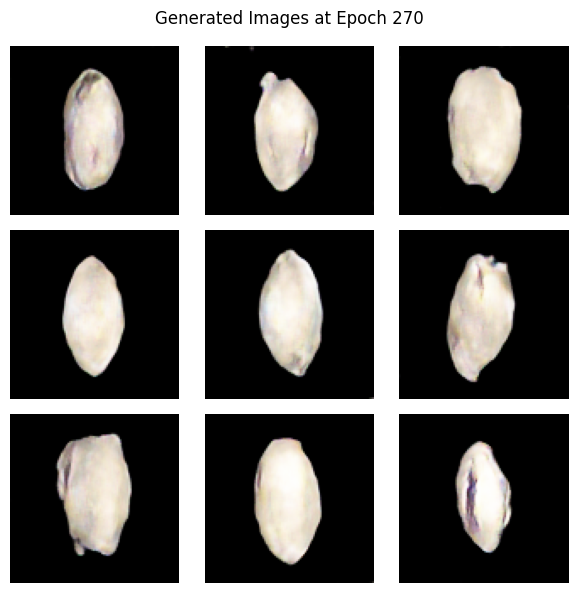

Epoch 271, Generator Loss: 1.1178, Discriminator Loss: 1.0169, Time: 7.25s
Epoch 272, Generator Loss: 1.1092, Discriminator Loss: 1.0246, Time: 7.23s
Epoch 273, Generator Loss: 1.1357, Discriminator Loss: 1.0062, Time: 7.34s
Epoch 274, Generator Loss: 1.1178, Discriminator Loss: 1.0104, Time: 7.25s
Epoch 275, Generator Loss: 1.1420, Discriminator Loss: 0.9901, Time: 7.31s
Epoch 276, Generator Loss: 1.1445, Discriminator Loss: 1.0341, Time: 7.24s
Epoch 277, Generator Loss: 1.1250, Discriminator Loss: 1.0182, Time: 7.33s
Epoch 278, Generator Loss: 1.1407, Discriminator Loss: 1.0056, Time: 7.24s
Epoch 279, Generator Loss: 1.1213, Discriminator Loss: 1.0147, Time: 7.22s
Epoch 280, Generator Loss: 1.1601, Discriminator Loss: 1.0000, Time: 7.29s


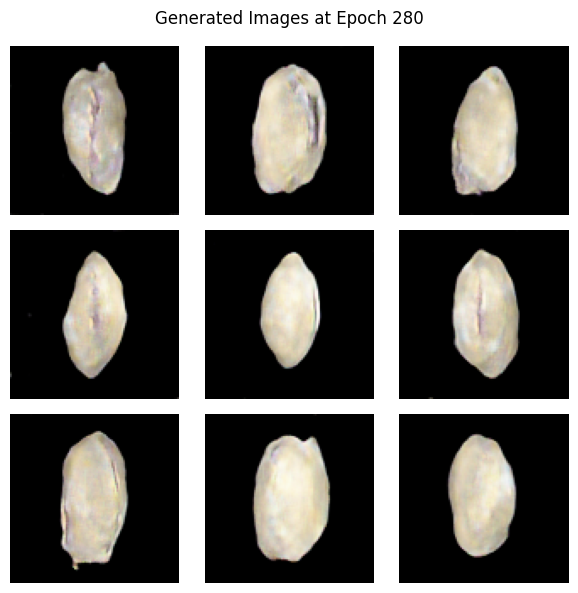

Epoch 281, Generator Loss: 1.1460, Discriminator Loss: 1.0232, Time: 7.39s
Epoch 282, Generator Loss: 1.1686, Discriminator Loss: 0.9917, Time: 7.31s
Epoch 283, Generator Loss: 1.1380, Discriminator Loss: 1.0038, Time: 7.31s
Epoch 284, Generator Loss: 1.1159, Discriminator Loss: 1.0210, Time: 7.25s
Epoch 285, Generator Loss: 1.1687, Discriminator Loss: 1.0104, Time: 7.32s
Epoch 286, Generator Loss: 1.1405, Discriminator Loss: 0.9852, Time: 7.30s
Epoch 287, Generator Loss: 1.1705, Discriminator Loss: 0.9857, Time: 7.23s
Epoch 288, Generator Loss: 1.1719, Discriminator Loss: 0.9767, Time: 7.21s
Epoch 289, Generator Loss: 1.1861, Discriminator Loss: 1.0039, Time: 7.24s
Epoch 290, Generator Loss: 1.1628, Discriminator Loss: 1.0046, Time: 7.28s


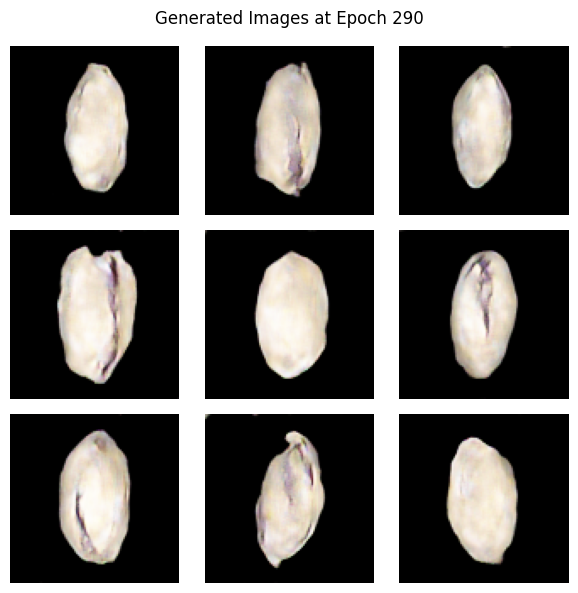

Epoch 291, Generator Loss: 1.1879, Discriminator Loss: 0.9531, Time: 7.29s
Epoch 292, Generator Loss: 1.1838, Discriminator Loss: 1.0129, Time: 7.26s
Epoch 293, Generator Loss: 1.1864, Discriminator Loss: 0.9922, Time: 7.29s
Epoch 294, Generator Loss: 1.1753, Discriminator Loss: 0.9794, Time: 7.31s
Epoch 295, Generator Loss: 1.1350, Discriminator Loss: 0.9978, Time: 7.28s
Epoch 296, Generator Loss: 1.1991, Discriminator Loss: 0.9581, Time: 7.24s
Epoch 297, Generator Loss: 1.2052, Discriminator Loss: 0.9773, Time: 7.27s
Epoch 298, Generator Loss: 1.1800, Discriminator Loss: 0.9951, Time: 7.26s
Epoch 299, Generator Loss: 1.1889, Discriminator Loss: 0.9714, Time: 7.27s
Epoch 300, Generator Loss: 1.2026, Discriminator Loss: 0.9565, Time: 7.29s


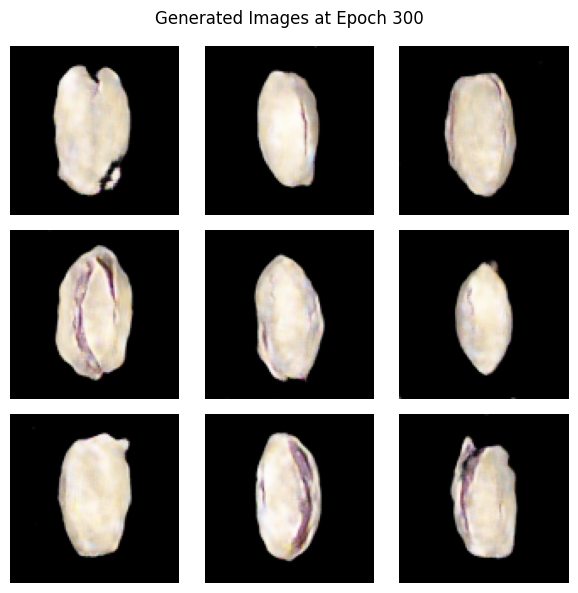

Epoch 301, Generator Loss: 1.1980, Discriminator Loss: 0.9581, Time: 7.25s
Epoch 302, Generator Loss: 1.2221, Discriminator Loss: 0.9652, Time: 7.23s
Epoch 303, Generator Loss: 1.2102, Discriminator Loss: 0.9466, Time: 7.28s
Epoch 304, Generator Loss: 1.2362, Discriminator Loss: 0.9810, Time: 7.28s
Epoch 305, Generator Loss: 1.2041, Discriminator Loss: 0.9579, Time: 7.25s
Epoch 306, Generator Loss: 1.2393, Discriminator Loss: 0.9211, Time: 7.25s
Epoch 307, Generator Loss: 1.2361, Discriminator Loss: 0.9596, Time: 7.29s
Epoch 308, Generator Loss: 1.2253, Discriminator Loss: 0.9680, Time: 7.23s
Epoch 309, Generator Loss: 1.2275, Discriminator Loss: 0.9493, Time: 7.19s
Epoch 310, Generator Loss: 1.2068, Discriminator Loss: 0.9546, Time: 7.23s


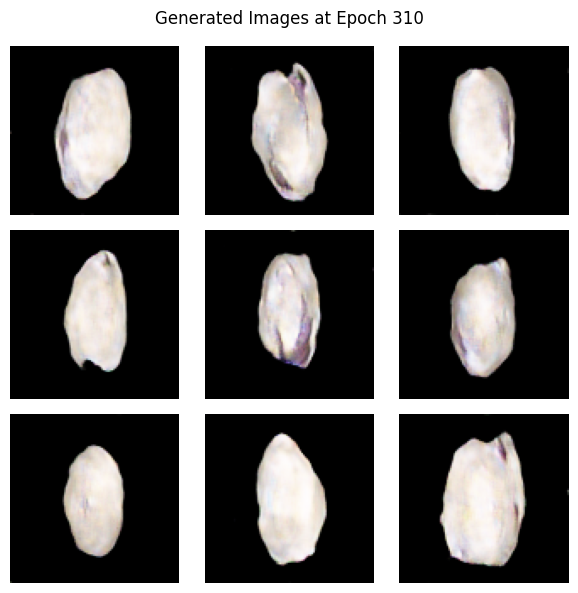

Epoch 311, Generator Loss: 1.2328, Discriminator Loss: 0.9536, Time: 7.32s
Epoch 312, Generator Loss: 1.2408, Discriminator Loss: 0.9374, Time: 7.24s
Epoch 313, Generator Loss: 1.2295, Discriminator Loss: 0.9674, Time: 7.27s
Epoch 314, Generator Loss: 1.2241, Discriminator Loss: 0.9606, Time: 7.23s
Epoch 315, Generator Loss: 1.2661, Discriminator Loss: 0.9287, Time: 7.22s
Epoch 316, Generator Loss: 1.2576, Discriminator Loss: 0.9597, Time: 7.31s
Epoch 317, Generator Loss: 1.2126, Discriminator Loss: 0.9529, Time: 7.24s
Epoch 318, Generator Loss: 1.2170, Discriminator Loss: 0.9430, Time: 7.25s
Epoch 319, Generator Loss: 1.2894, Discriminator Loss: 0.9251, Time: 7.23s
Epoch 320, Generator Loss: 1.2968, Discriminator Loss: 0.9177, Time: 7.29s


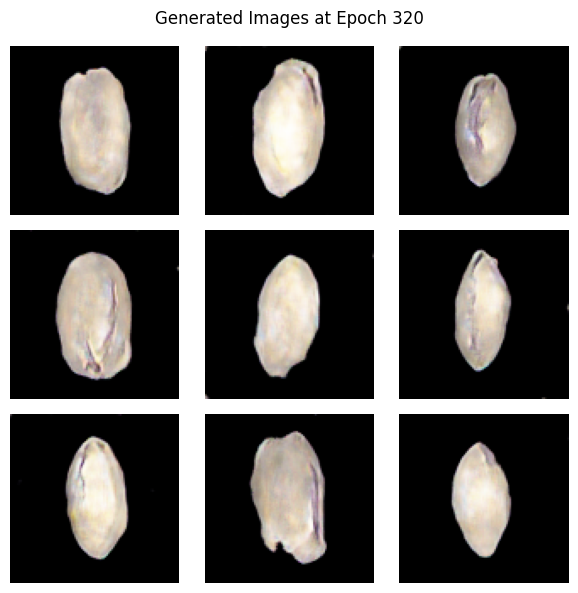

Epoch 321, Generator Loss: 1.2541, Discriminator Loss: 0.9284, Time: 7.22s
Epoch 322, Generator Loss: 1.2781, Discriminator Loss: 0.9375, Time: 7.24s
Epoch 323, Generator Loss: 1.2861, Discriminator Loss: 0.9072, Time: 7.27s
Epoch 324, Generator Loss: 1.2644, Discriminator Loss: 0.9457, Time: 7.35s
Epoch 325, Generator Loss: 1.2828, Discriminator Loss: 0.9188, Time: 7.28s
Epoch 326, Generator Loss: 1.2935, Discriminator Loss: 0.9173, Time: 7.22s
Epoch 327, Generator Loss: 1.2571, Discriminator Loss: 0.9524, Time: 7.20s
Epoch 328, Generator Loss: 1.2587, Discriminator Loss: 0.9290, Time: 7.24s
Epoch 329, Generator Loss: 1.2953, Discriminator Loss: 0.9057, Time: 7.30s
Epoch 330, Generator Loss: 1.3193, Discriminator Loss: 0.9133, Time: 7.25s


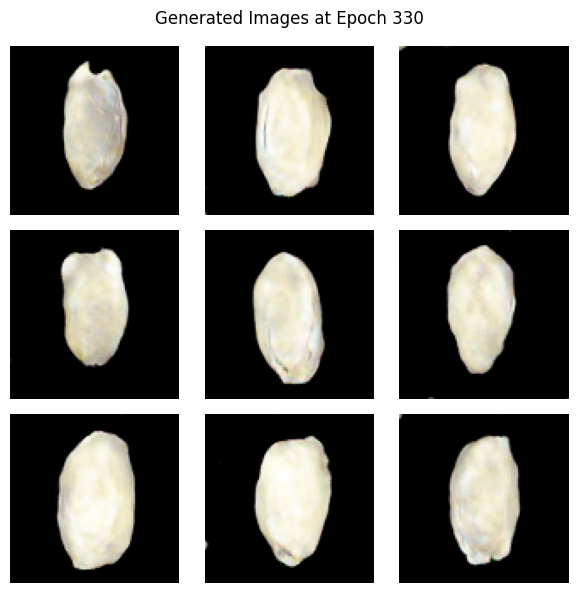

Epoch 331, Generator Loss: 1.3161, Discriminator Loss: 0.8881, Time: 7.21s
Epoch 332, Generator Loss: 1.2890, Discriminator Loss: 0.9255, Time: 7.21s
Epoch 333, Generator Loss: 1.3110, Discriminator Loss: 0.9156, Time: 7.28s
Epoch 334, Generator Loss: 1.2987, Discriminator Loss: 0.9013, Time: 7.22s
Epoch 335, Generator Loss: 1.2788, Discriminator Loss: 0.9267, Time: 7.21s
Epoch 336, Generator Loss: 1.3080, Discriminator Loss: 0.8994, Time: 7.22s
Epoch 337, Generator Loss: 1.2984, Discriminator Loss: 0.9070, Time: 7.28s
Epoch 338, Generator Loss: 1.3178, Discriminator Loss: 0.9224, Time: 7.20s
Epoch 339, Generator Loss: 1.3185, Discriminator Loss: 0.9143, Time: 7.23s
Epoch 340, Generator Loss: 1.3157, Discriminator Loss: 0.9293, Time: 7.22s


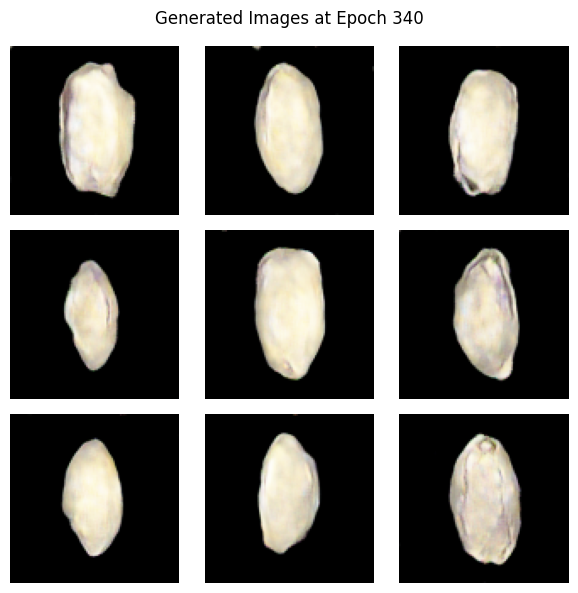

Epoch 341, Generator Loss: 1.2996, Discriminator Loss: 0.9017, Time: 7.25s
Epoch 342, Generator Loss: 1.3146, Discriminator Loss: 0.9118, Time: 7.29s
Epoch 343, Generator Loss: 1.3103, Discriminator Loss: 0.9079, Time: 7.23s
Epoch 344, Generator Loss: 1.3339, Discriminator Loss: 0.9106, Time: 7.22s
Epoch 345, Generator Loss: 1.3400, Discriminator Loss: 0.8868, Time: 7.21s
Epoch 346, Generator Loss: 1.3371, Discriminator Loss: 0.8662, Time: 7.30s
Epoch 347, Generator Loss: 1.3510, Discriminator Loss: 0.8867, Time: 7.21s
Epoch 348, Generator Loss: 1.3515, Discriminator Loss: 0.8987, Time: 7.21s
Epoch 349, Generator Loss: 1.3621, Discriminator Loss: 0.8808, Time: 7.23s
Epoch 350, Generator Loss: 1.3320, Discriminator Loss: 0.9062, Time: 7.28s


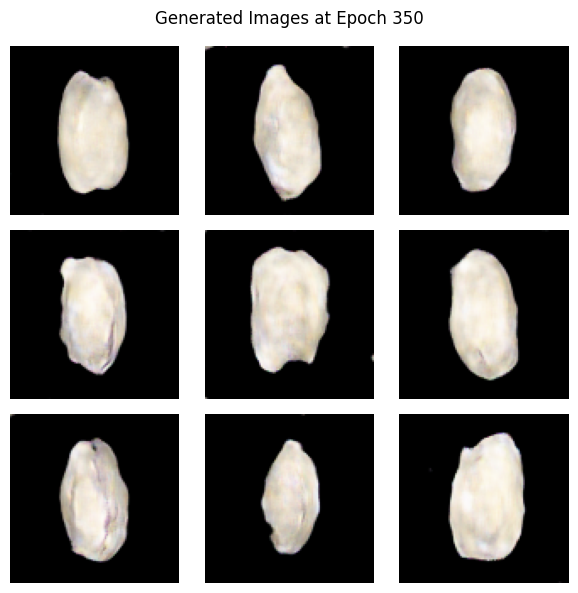

Epoch 351, Generator Loss: 1.3328, Discriminator Loss: 0.8655, Time: 7.27s
Epoch 352, Generator Loss: 1.3636, Discriminator Loss: 0.8728, Time: 7.26s
Epoch 353, Generator Loss: 1.3675, Discriminator Loss: 0.9074, Time: 7.22s
Epoch 354, Generator Loss: 1.3461, Discriminator Loss: 0.8853, Time: 7.31s
Epoch 355, Generator Loss: 1.3644, Discriminator Loss: 0.8711, Time: 7.28s
Epoch 356, Generator Loss: 1.3509, Discriminator Loss: 0.8851, Time: 7.25s
Epoch 357, Generator Loss: 1.3729, Discriminator Loss: 0.8783, Time: 7.24s
Epoch 358, Generator Loss: 1.3564, Discriminator Loss: 0.8776, Time: 7.28s
Epoch 359, Generator Loss: 1.3634, Discriminator Loss: 0.8900, Time: 7.33s
Epoch 360, Generator Loss: 1.3661, Discriminator Loss: 0.8842, Time: 7.23s


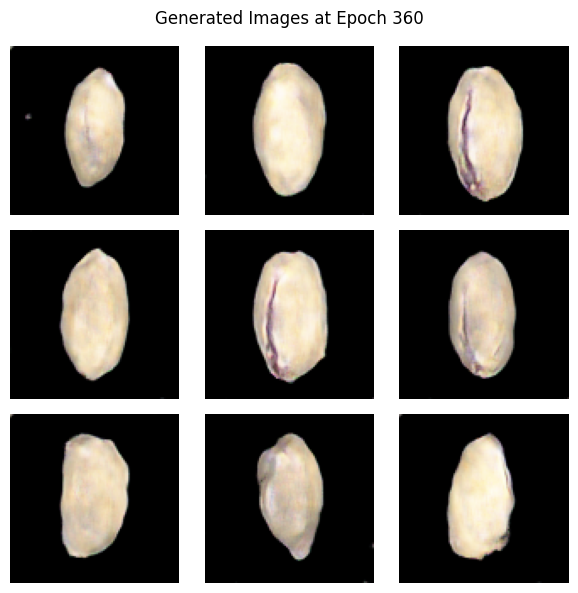

Epoch 361, Generator Loss: 1.3807, Discriminator Loss: 0.8799, Time: 7.25s
Epoch 362, Generator Loss: 1.3699, Discriminator Loss: 0.8621, Time: 7.23s
Epoch 363, Generator Loss: 1.3825, Discriminator Loss: 0.8781, Time: 7.36s
Epoch 364, Generator Loss: 1.4138, Discriminator Loss: 0.8617, Time: 7.22s
Epoch 365, Generator Loss: 1.3700, Discriminator Loss: 0.8510, Time: 7.23s
Epoch 366, Generator Loss: 1.3996, Discriminator Loss: 0.8713, Time: 7.36s
Epoch 367, Generator Loss: 1.3469, Discriminator Loss: 0.8809, Time: 7.46s
Epoch 368, Generator Loss: 1.3692, Discriminator Loss: 0.8492, Time: 7.26s
Epoch 369, Generator Loss: 1.3643, Discriminator Loss: 0.8756, Time: 7.28s
Epoch 370, Generator Loss: 1.4321, Discriminator Loss: 0.8483, Time: 7.26s


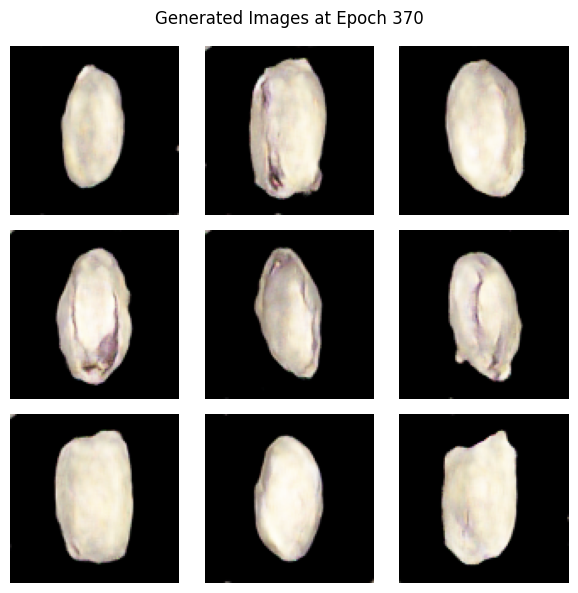

Epoch 371, Generator Loss: 1.3339, Discriminator Loss: 0.8873, Time: 7.25s
Epoch 372, Generator Loss: 1.4279, Discriminator Loss: 0.8510, Time: 7.33s
Epoch 373, Generator Loss: 1.3944, Discriminator Loss: 0.8620, Time: 7.25s
Epoch 374, Generator Loss: 1.3988, Discriminator Loss: 0.8587, Time: 7.25s
Epoch 375, Generator Loss: 1.4204, Discriminator Loss: 0.8370, Time: 7.22s
Epoch 376, Generator Loss: 1.3985, Discriminator Loss: 0.8783, Time: 7.36s
Epoch 377, Generator Loss: 1.4359, Discriminator Loss: 0.8582, Time: 7.36s
Epoch 378, Generator Loss: 1.3808, Discriminator Loss: 0.8562, Time: 7.40s
Epoch 379, Generator Loss: 1.4225, Discriminator Loss: 0.8566, Time: 7.35s
Epoch 380, Generator Loss: 1.4429, Discriminator Loss: 0.8269, Time: 7.32s


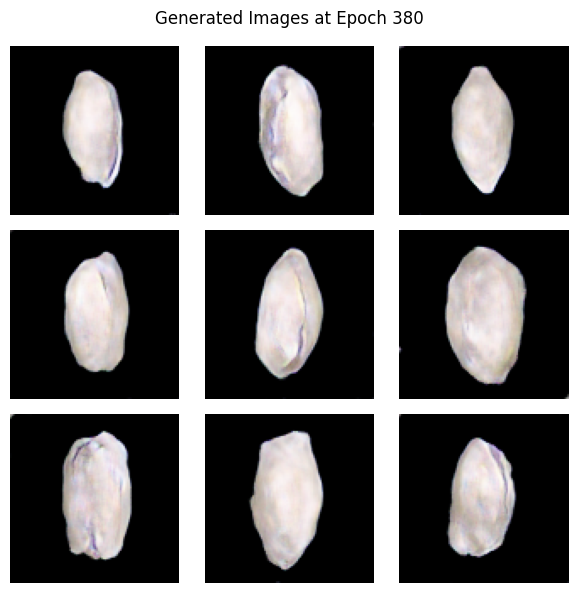

Epoch 381, Generator Loss: 1.4528, Discriminator Loss: 0.8446, Time: 7.26s
Epoch 382, Generator Loss: 1.3983, Discriminator Loss: 0.8531, Time: 7.27s
Epoch 383, Generator Loss: 1.4482, Discriminator Loss: 0.8433, Time: 7.27s
Epoch 384, Generator Loss: 1.4456, Discriminator Loss: 0.8345, Time: 7.36s
Epoch 385, Generator Loss: 1.4313, Discriminator Loss: 0.8619, Time: 7.30s
Epoch 386, Generator Loss: 1.4537, Discriminator Loss: 0.8277, Time: 7.28s
Epoch 387, Generator Loss: 1.4610, Discriminator Loss: 0.8129, Time: 7.23s
Epoch 388, Generator Loss: 1.4270, Discriminator Loss: 0.8624, Time: 7.28s
Epoch 389, Generator Loss: 1.4302, Discriminator Loss: 0.8400, Time: 7.33s
Epoch 390, Generator Loss: 1.4596, Discriminator Loss: 0.8109, Time: 7.25s


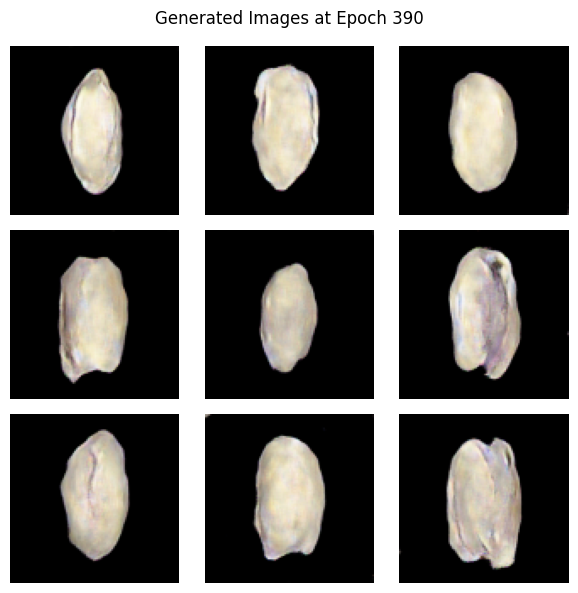

Epoch 391, Generator Loss: 1.4393, Discriminator Loss: 0.8316, Time: 7.24s
Epoch 392, Generator Loss: 1.4874, Discriminator Loss: 0.7874, Time: 7.25s
Epoch 393, Generator Loss: 1.4519, Discriminator Loss: 0.8215, Time: 7.38s
Epoch 394, Generator Loss: 1.4876, Discriminator Loss: 0.8146, Time: 7.25s
Epoch 395, Generator Loss: 1.4945, Discriminator Loss: 0.8003, Time: 7.25s
Epoch 396, Generator Loss: 1.4546, Discriminator Loss: 0.8248, Time: 7.22s
Epoch 397, Generator Loss: 1.4940, Discriminator Loss: 0.8258, Time: 7.36s
Epoch 398, Generator Loss: 1.4700, Discriminator Loss: 0.8573, Time: 7.20s
Epoch 399, Generator Loss: 1.4687, Discriminator Loss: 0.8220, Time: 7.25s
Epoch 400, Generator Loss: 1.5016, Discriminator Loss: 0.8030, Time: 7.25s


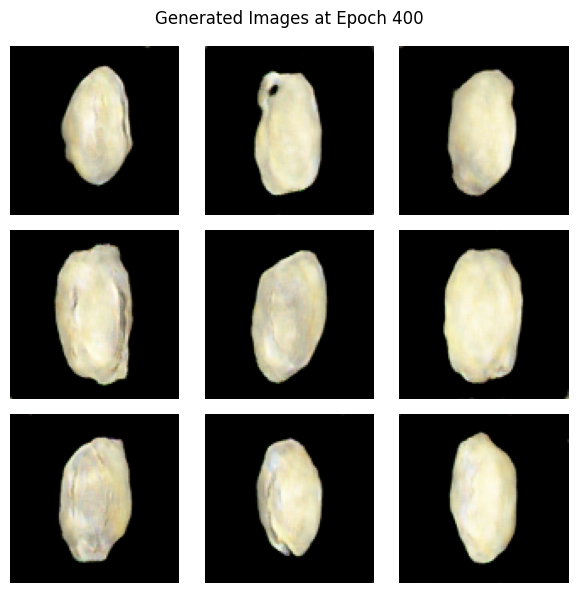

Epoch 401, Generator Loss: 1.4806, Discriminator Loss: 0.8300, Time: 7.23s
Epoch 402, Generator Loss: 1.4833, Discriminator Loss: 0.8007, Time: 7.33s
Epoch 403, Generator Loss: 1.4902, Discriminator Loss: 0.8027, Time: 7.28s
Epoch 404, Generator Loss: 1.4975, Discriminator Loss: 0.8030, Time: 7.25s
Epoch 405, Generator Loss: 1.5110, Discriminator Loss: 0.8224, Time: 7.21s
Epoch 406, Generator Loss: 1.5060, Discriminator Loss: 0.8359, Time: 7.29s
Epoch 407, Generator Loss: 1.4988, Discriminator Loss: 0.7892, Time: 7.26s
Epoch 408, Generator Loss: 1.4938, Discriminator Loss: 0.8062, Time: 7.26s
Epoch 409, Generator Loss: 1.5620, Discriminator Loss: 0.7843, Time: 7.28s
Epoch 410, Generator Loss: 1.5542, Discriminator Loss: 0.8090, Time: 7.43s


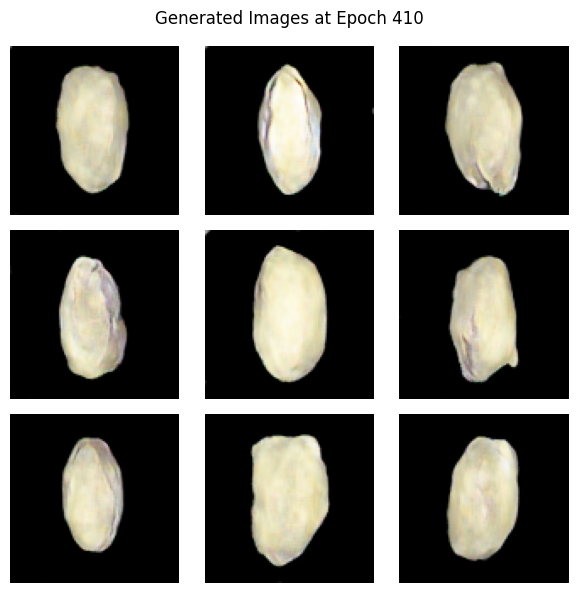

Epoch 411, Generator Loss: 1.5494, Discriminator Loss: 0.7884, Time: 7.27s
Epoch 412, Generator Loss: 1.4923, Discriminator Loss: 0.8204, Time: 7.25s
Epoch 413, Generator Loss: 1.5089, Discriminator Loss: 0.7855, Time: 7.24s
Epoch 414, Generator Loss: 1.5251, Discriminator Loss: 0.8099, Time: 7.29s
Epoch 415, Generator Loss: 1.5095, Discriminator Loss: 0.8021, Time: 7.33s
Epoch 416, Generator Loss: 1.5266, Discriminator Loss: 0.8105, Time: 7.24s
Epoch 417, Generator Loss: 1.5356, Discriminator Loss: 0.7933, Time: 7.31s
Epoch 418, Generator Loss: 1.5042, Discriminator Loss: 0.7827, Time: 7.24s
Epoch 419, Generator Loss: 1.5759, Discriminator Loss: 0.7610, Time: 7.30s
Epoch 420, Generator Loss: 1.5892, Discriminator Loss: 0.7635, Time: 7.22s


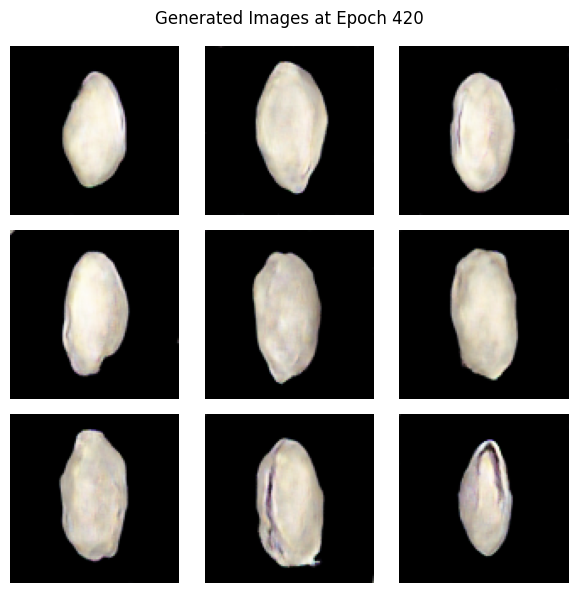

Epoch 421, Generator Loss: 1.5358, Discriminator Loss: 0.8044, Time: 7.28s
Epoch 422, Generator Loss: 1.5475, Discriminator Loss: 0.7884, Time: 7.27s
Epoch 423, Generator Loss: 1.5505, Discriminator Loss: 0.7773, Time: 7.39s
Epoch 424, Generator Loss: 1.6125, Discriminator Loss: 0.7758, Time: 7.25s
Epoch 425, Generator Loss: 1.5559, Discriminator Loss: 0.7753, Time: 7.30s
Epoch 426, Generator Loss: 1.5309, Discriminator Loss: 0.7657, Time: 7.27s
Epoch 427, Generator Loss: 1.5891, Discriminator Loss: 0.7544, Time: 7.31s
Epoch 428, Generator Loss: 1.5455, Discriminator Loss: 0.7774, Time: 7.32s
Epoch 429, Generator Loss: 1.5753, Discriminator Loss: 0.7732, Time: 7.34s
Epoch 430, Generator Loss: 1.5980, Discriminator Loss: 0.7615, Time: 7.27s


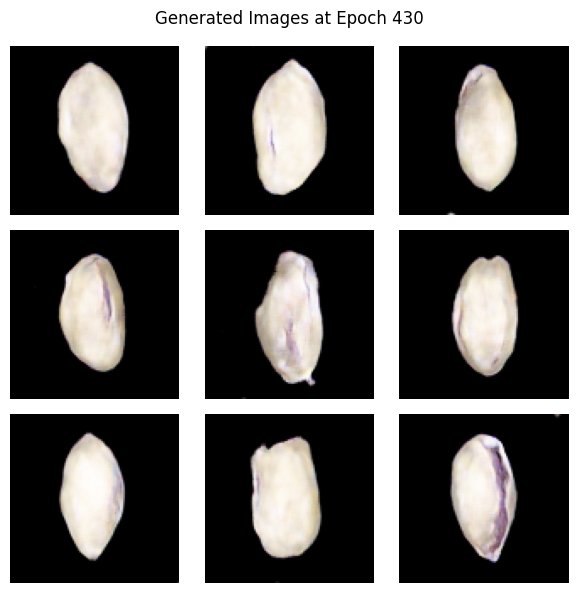

Epoch 431, Generator Loss: 1.5485, Discriminator Loss: 0.7897, Time: 7.28s
Epoch 432, Generator Loss: 1.6114, Discriminator Loss: 0.7688, Time: 7.45s
Epoch 433, Generator Loss: 1.5818, Discriminator Loss: 0.7857, Time: 7.33s
Epoch 434, Generator Loss: 1.5671, Discriminator Loss: 0.7486, Time: 7.39s
Epoch 435, Generator Loss: 1.6399, Discriminator Loss: 0.7671, Time: 7.33s
Epoch 436, Generator Loss: 1.5878, Discriminator Loss: 0.7409, Time: 7.37s
Epoch 437, Generator Loss: 1.6169, Discriminator Loss: 0.7578, Time: 7.30s
Epoch 438, Generator Loss: 1.6226, Discriminator Loss: 0.7580, Time: 7.24s
Epoch 439, Generator Loss: 1.6137, Discriminator Loss: 0.7527, Time: 7.23s
Epoch 440, Generator Loss: 1.6378, Discriminator Loss: 0.7498, Time: 7.32s


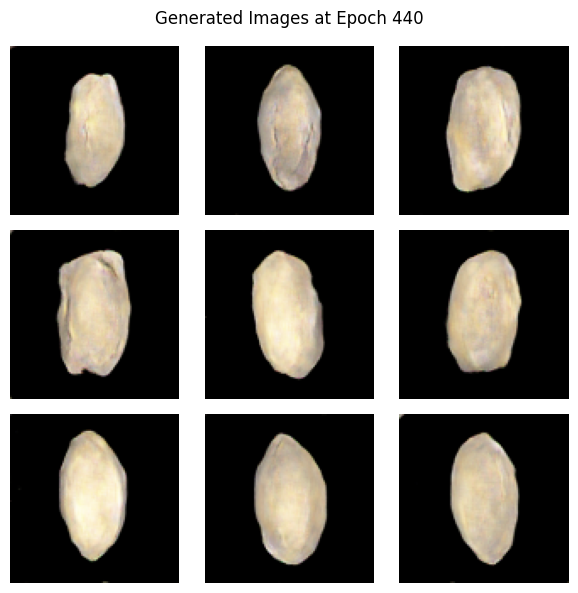

Epoch 441, Generator Loss: 1.6387, Discriminator Loss: 0.7288, Time: 7.21s
Epoch 442, Generator Loss: 1.6605, Discriminator Loss: 0.7356, Time: 7.22s
Epoch 443, Generator Loss: 1.6066, Discriminator Loss: 0.7665, Time: 7.24s
Epoch 444, Generator Loss: 1.6231, Discriminator Loss: 0.7582, Time: 7.24s
Epoch 445, Generator Loss: 1.6494, Discriminator Loss: 0.7382, Time: 7.33s
Epoch 446, Generator Loss: 1.6113, Discriminator Loss: 0.7714, Time: 7.22s
Epoch 447, Generator Loss: 1.6329, Discriminator Loss: 0.7422, Time: 7.27s
Epoch 448, Generator Loss: 1.6652, Discriminator Loss: 0.7526, Time: 7.34s
Epoch 449, Generator Loss: 1.6316, Discriminator Loss: 0.7292, Time: 7.38s
Epoch 450, Generator Loss: 1.6448, Discriminator Loss: 0.7280, Time: 7.27s


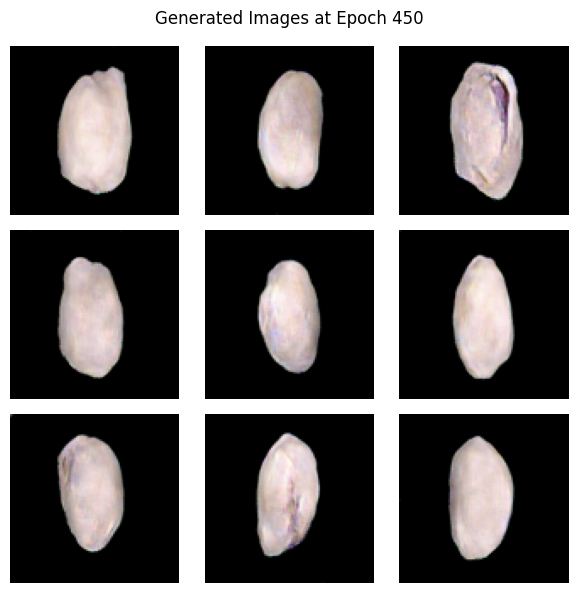

Epoch 451, Generator Loss: 1.6324, Discriminator Loss: 0.7509, Time: 7.28s
Epoch 452, Generator Loss: 1.6394, Discriminator Loss: 0.7681, Time: 7.31s
Epoch 453, Generator Loss: 1.6199, Discriminator Loss: 0.7385, Time: 7.35s
Epoch 454, Generator Loss: 1.6324, Discriminator Loss: 0.7486, Time: 7.22s
Epoch 455, Generator Loss: 1.6593, Discriminator Loss: 0.7295, Time: 7.23s
Epoch 456, Generator Loss: 1.6520, Discriminator Loss: 0.7611, Time: 7.23s
Epoch 457, Generator Loss: 1.6569, Discriminator Loss: 0.7101, Time: 7.22s
Epoch 458, Generator Loss: 1.6455, Discriminator Loss: 0.7666, Time: 7.28s
Epoch 459, Generator Loss: 1.7021, Discriminator Loss: 0.7263, Time: 7.22s
Epoch 460, Generator Loss: 1.6377, Discriminator Loss: 0.7428, Time: 7.21s


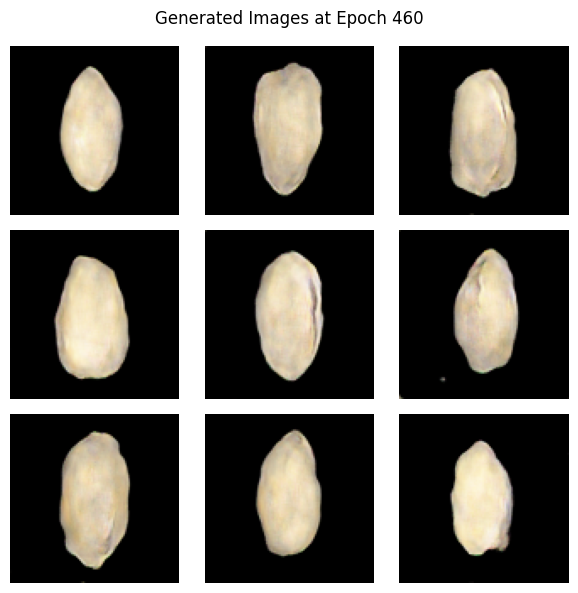

Epoch 461, Generator Loss: 1.6606, Discriminator Loss: 0.7286, Time: 7.21s
Epoch 462, Generator Loss: 1.6775, Discriminator Loss: 0.7388, Time: 7.34s
Epoch 463, Generator Loss: 1.6609, Discriminator Loss: 0.7236, Time: 7.21s
Epoch 464, Generator Loss: 1.6839, Discriminator Loss: 0.7255, Time: 7.23s
Epoch 465, Generator Loss: 1.6896, Discriminator Loss: 0.7076, Time: 7.21s
Epoch 466, Generator Loss: 1.6634, Discriminator Loss: 0.7296, Time: 7.32s
Epoch 467, Generator Loss: 1.6655, Discriminator Loss: 0.7383, Time: 7.26s
Epoch 468, Generator Loss: 1.7204, Discriminator Loss: 0.7092, Time: 7.21s
Epoch 469, Generator Loss: 1.7383, Discriminator Loss: 0.7186, Time: 7.21s
Epoch 470, Generator Loss: 1.6394, Discriminator Loss: 0.7340, Time: 7.25s


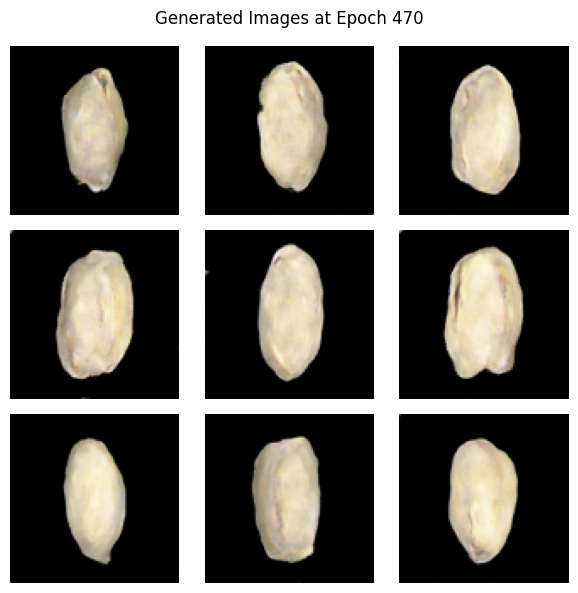

Epoch 471, Generator Loss: 1.6887, Discriminator Loss: 0.7408, Time: 7.24s
Epoch 472, Generator Loss: 1.6579, Discriminator Loss: 0.7287, Time: 7.23s
Epoch 473, Generator Loss: 1.7215, Discriminator Loss: 0.7005, Time: 7.24s
Epoch 474, Generator Loss: 1.7302, Discriminator Loss: 0.6903, Time: 7.25s
Epoch 475, Generator Loss: 1.7395, Discriminator Loss: 0.7188, Time: 7.36s
Epoch 476, Generator Loss: 1.7293, Discriminator Loss: 0.7172, Time: 7.22s
Epoch 477, Generator Loss: 1.6652, Discriminator Loss: 0.7538, Time: 7.22s
Epoch 478, Generator Loss: 1.7417, Discriminator Loss: 0.7175, Time: 7.26s
Epoch 479, Generator Loss: 1.6788, Discriminator Loss: 0.7432, Time: 7.31s
Epoch 480, Generator Loss: 1.7159, Discriminator Loss: 0.7183, Time: 7.25s


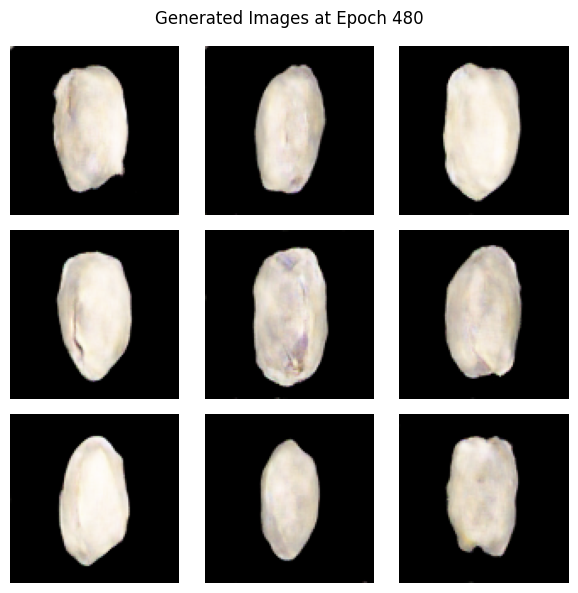

Epoch 481, Generator Loss: 1.7060, Discriminator Loss: 0.6892, Time: 7.26s
Epoch 482, Generator Loss: 1.7309, Discriminator Loss: 0.7266, Time: 7.25s
Epoch 483, Generator Loss: 1.7391, Discriminator Loss: 0.6665, Time: 7.29s
Epoch 484, Generator Loss: 1.7644, Discriminator Loss: 0.6932, Time: 7.24s
Epoch 485, Generator Loss: 1.7231, Discriminator Loss: 0.7012, Time: 7.22s
Epoch 486, Generator Loss: 1.7716, Discriminator Loss: 0.6676, Time: 7.23s
Epoch 487, Generator Loss: 1.8029, Discriminator Loss: 0.6625, Time: 7.25s
Epoch 488, Generator Loss: 1.7475, Discriminator Loss: 0.6982, Time: 7.34s
Epoch 489, Generator Loss: 1.7652, Discriminator Loss: 0.6809, Time: 7.26s
Epoch 490, Generator Loss: 1.7881, Discriminator Loss: 0.6617, Time: 7.26s


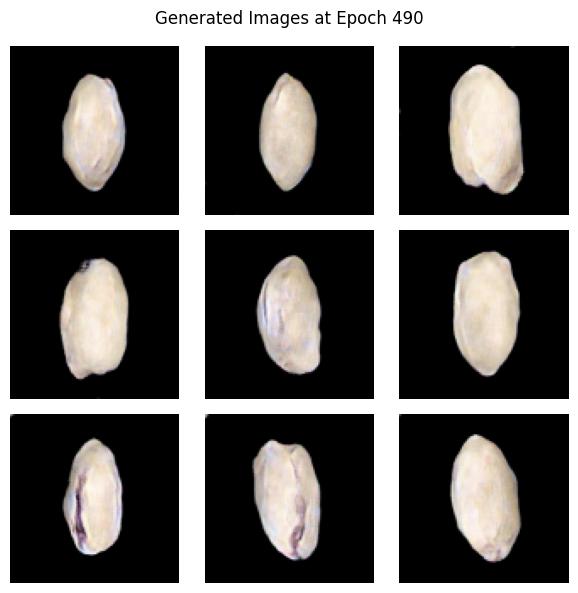

Epoch 491, Generator Loss: 1.8168, Discriminator Loss: 0.6976, Time: 7.25s
Epoch 492, Generator Loss: 1.7963, Discriminator Loss: 0.6732, Time: 7.28s
Epoch 493, Generator Loss: 1.7581, Discriminator Loss: 0.6970, Time: 7.26s
Epoch 494, Generator Loss: 1.8008, Discriminator Loss: 0.6643, Time: 7.28s
Epoch 495, Generator Loss: 1.8563, Discriminator Loss: 0.6568, Time: 7.33s
Epoch 496, Generator Loss: 1.8166, Discriminator Loss: 0.6802, Time: 7.30s
Epoch 497, Generator Loss: 1.8406, Discriminator Loss: 0.6714, Time: 7.27s
Epoch 498, Generator Loss: 1.7545, Discriminator Loss: 0.6889, Time: 7.26s
Epoch 499, Generator Loss: 1.8090, Discriminator Loss: 0.6687, Time: 7.28s
Epoch 500, Generator Loss: 1.7724, Discriminator Loss: 0.7014, Time: 7.30s


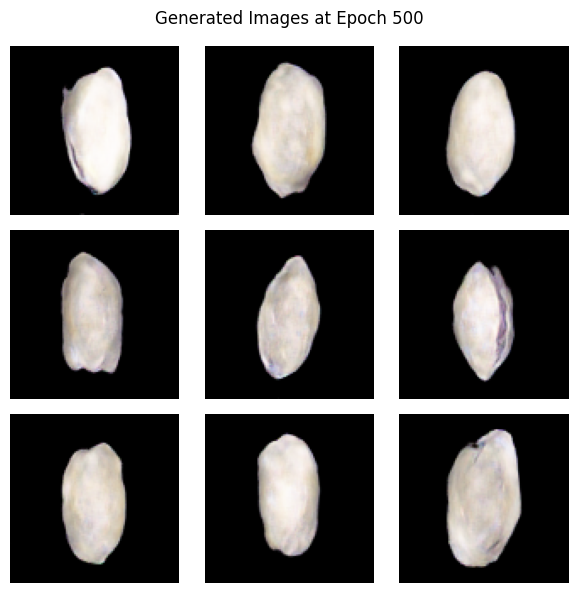

In [84]:
EPOCHS_TUNED = 500
train_tuned(train_dataset, EPOCHS_TUNED)

Setelah 500 epoch, dilihat dari gen_loss dan disc_loss nya, Generator sangat sulit menipu Discriminator. Sedangkan Discriminator dengan mudah membedakan gambar asli dan palsu. Ini menunjukkan ketidakseimbangan antara Generator dan Discriminator.

Secara visual, gambar masih blurry tetapi jika dibandingkan dengan model baseline, bentuknya sudah lebih mirip dengan data aktual.

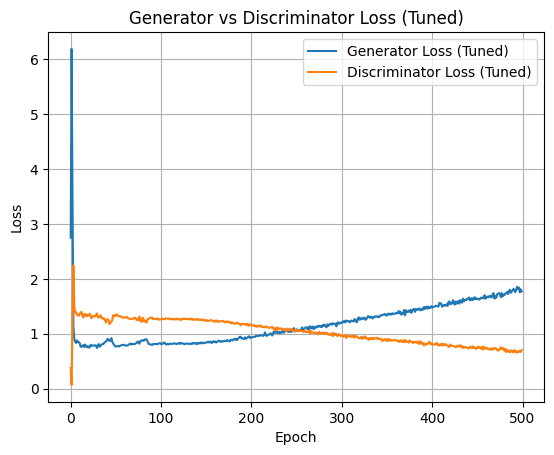

In [85]:
plt.plot(gen_losses_tuned, label="Generator Loss (Tuned)")
plt.plot(disc_losses_tuned, label="Discriminator Loss (Tuned)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Generator vs Discriminator Loss (Tuned)")
plt.grid(True)
plt.show()

gen-loss: awalnya tinggi (>6) kemudian turun tetapi mulai epoch 200 mulai naik lagi hingga epoch 500.

disc_loss = awalnya rendah (+-0.5) kemudian sempat naik sebentar kemudian turun konsisten hingga epoch 500.

Kesimpulannya, Generator masih kalah dari Discriminator. Jika gap semakin lebar, Generator bisa berhenti belajar variasi (collapse).

## Evaluasi

In [ ]:
inception = InceptionV3(
    include_top=False,
    pooling='avg',
    input_shape=(299, 299, 3),
    weights=None  
)

inception.load_weights("/kaggle/input/inception/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5")

In [ ]:
def preprocess_input(images):
    images = tf.cast(images, tf.float32)
    return (images / 127.5) - 1.0

In [ ]:
def get_features(images):
    images = tf.image.resize(images, (299, 299))
    images = preprocess_input(images * 255.0) 
    features = inception(images, training=False)
    return features.numpy()

def calculate_fid_manual(real_images, generated_images):
    act1 = get_features(real_images)
    act2 = get_features(generated_images)

    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)

    ssdiff = np.sum((mu1 - mu2)**2)
    covmean = sqrtm(sigma1 @ sigma2)

    if np.iscomplexobj(covmean):
        covmean = covmean.real

    fid = ssdiff + np.trace(sigma1 + sigma2 - 2 * covmean)
    return fid

- melakukan resize gambar
- normalisasi pixel
- ekstraksi fitur
- konversi ke NumPy

### baseline model

In [ ]:
real_batch = next(iter(train_dataset)) 

noise = tf.random.normal([real_batch.shape[0], LATENT_DIM])
fake_batch = generator(noise, training=False)

fake_batch = tf.clip_by_value(fake_batch, -1, 1)

real_eval = (real_batch + 1.0) / 2.0
fake_eval = (fake_batch + 1.0) / 2.0

fid_score = calculate_fid_manual(real_eval, fake_eval)
print(f"FID Score: {fid_score:.4f}")

FID Score: 278.3307


FID sebesar 278.3307 menandakan performa model sangat buruk. Hal ini bisa disebabkan oleh arsitektur model terlalu sederhana, dataset terlalu kecil, ataupun jumlah epoch belum cukup sehingga hasil training belum konvergen.

### modified model

In [ ]:
real_batch = next(iter(train_dataset))

noise = tf.random.normal([real_batch.shape[0], LATENT_DIM_TUNED])
fake_batch = generator_tuned(noise, training=False)

fake_batch = tf.clip_by_value(fake_batch, -1, 1)

real_eval = (real_batch + 1.0) / 2.0
fake_eval = (fake_batch + 1.0) / 2.0

fid_score = calculate_fid_manual(real_eval, fake_eval)
print(f"FID Score (Tuned): {fid_score:.4f}")

FID Score (Tuned): 196.4815


FID sebesar 196.4815 menandakan performa model sangat buruk. Tetapi, jika dinilai dari skor FID, performa model tuned sudah lebih baik.

## Kesimpulan
Overall, performa model baseline dan tuned belum optimal. Tetapi, skor FID model tuned lebih baik dan gambar yang dihasilkan model tuned juga lebih mirip dengan gambar aktual jika ditinjau secara visual. Hal ini bisa disebabkan oleh arsitektur model terlalu sederhana, dataset terlalu kecil, ataupun jumlah epoch (karena keterbatasan sumber daya komputasi) belum cukup sehingga hasil training belum konvergen.